In [ ]:
!pip install optuna
!pip install pytorch-lightning
!pip install pytorch-forecasting

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 308 kB 11.8 MB/s 
     |████████████████████████████████| 209 kB 57.9 MB/s 
     |████████████████████████████████| 81 kB 7.1 MB/s 
     |████████████████████████████████| 78 kB 6.8 MB/s 
     |████████████████████████████████| 146 kB 62.5 MB/s 
     |████████████████████████████████| 49 kB 6.0 MB/s 
     |████████████████████████████████| 112 kB 62.3 MB/s 
  Created wheel for pyperclip: filename=pyperclip-1.8.2-py3-none-any.whl size=11137 sha256=d7bd3b1d44fe1d8653d522bf8ce386d54e4c619540c634e5a0e774fcee05fbf0
  Stored in directory: /root/.cache/pip/wheels/9f/18/84/8f69f8b08169c7bae2dde6bd7daf0c19fca8c8e500ee620a28
Successfully built pyperclip
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 585 kB 12.0 MB/s 
     |████████████████████████████████| 596 kB 60.4 

In [ ]:
import os
import warnings
import pickle
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import joblib
import optuna

from typing import Any, Callable, Dict, List, Optional, Tuple, Union
from sklearn.preprocessing import MinMaxScaler


import torch
import torch.nn.functional as F
from torch import distributions

import pytorch_lightning as pl
from pytorch_lightning.loggers import TensorBoardLogger
from pytorch_lightning.callbacks import EarlyStopping, LearningRateMonitor
from pytorch_forecasting.data.examples import generate_ar_data

from pytorch_forecasting import Baseline, DeepAR, TimeSeriesDataSet
from pytorch_forecasting.data import NaNLabelEncoder
from pytorch_forecasting.metrics import SMAPE, DistributionLoss, NormalDistributionLoss, LogNormalDistributionLoss, BaseEstimator
from pytorch_forecasting.data.encoders import GroupNormalizer

import tensorflow as tf 
import tensorboard as tb 
tf.io.gfile = tb.compat.tensorflow_stub.io.gfile

warnings.filterwarnings('ignore')
%matplotlib inline

logger = TensorBoardLogger('.', name = 'DeepAR')

from datetime import datetime

save_path = '/content/drive/MyDrive/Colab Notebooks/실무인증/Data/'
datetime.today()
today = datetime.today()
str_today = today.strftime('%y%m%d%H')
save_model = save_path + str_today + '_DeepAR_pca_saved_model.pth'
save_model

/usr/local/lib/python3.7/dist-packages/torchmetrics/utilities/prints.py:36: UserWarning: Torchmetrics v0.9 introduced a new argument class property called `full_state_update` that has
                not been set for this class (SMAPE). The property determines if `update` by
                default needs access to the full metric state. If this is not the case, significant speedups can be
                achieved and we recommend setting this to `False`.
                We provide an checking function
                `from torchmetrics.utilities import check_forward_no_full_state`
                that can be used to check if the `full_state_update=True` (old and potential slower behaviour,
                default for now) or if `full_state_update=False` can be used safely.
                
  warnings.warn(*args, **kwargs)


'/content/drive/MyDrive/Colab Notebooks/실무인증/Data/22061912_DeepAR_pca_saved_model.pth'

In [ ]:
class MultivariateDistributionLoss(DistributionLoss):
    """Base class for multivariate distribution losses.

    Class should be inherited for all multivariate distribution losses, i.e. if a batch of values
    is predicted in one go and the batch dimension is not independent, but the time dimension still
    remains independent.
    """

    def sample(self, y_pred, n_samples: int) -> torch.Tensor:
        """
        Sample from distribution.

        Args:
            y_pred: prediction output of network (shape batch_size x n_timesteps x n_paramters)
            n_samples (int): number of samples to draw

        Returns:
            torch.Tensor: tensor with samples  (shape batch_size x n_timesteps x n_samples)
        """
        dist = self.map_x_to_distribution(y_pred)
        samples = dist.sample((n_samples,)).permute(
            2, 1, 0
        )  # returned as (n_samples, n_timesteps, batch_size), so reshape to (batch_size, n_timesteps, n_samples)
        return samples


    def to_prediction(self, y_pred: torch.Tensor) -> torch.Tensor:
        """
        Convert network prediction into a point prediction.

        Args:
            y_pred: prediction output of network

        Returns:
            torch.Tensor: mean prediction
        """
        distribution = self.map_x_to_distribution(y_pred)

        return distribution.mean.transpose(0, 1)  # switch to batch_size x n_timesteps


    def loss(self, y_pred: torch.Tensor, y_actual: torch.Tensor) -> torch.Tensor:
        """
        Calculate negative likelihood

        Args:
            y_pred: network output
            y_actual: actual values

        Returns:
            torch.Tensor: metric value on which backpropagation can be applied
        """
        distribution = self.map_x_to_distribution(y_pred)
        # calculate one number and scale with batch size
        loss = -distribution.log_prob(y_actual.transpose(0, 1)).sum() * y_actual.size(0)
        return loss

In [ ]:
class MultivariateNormalDistributionLoss(MultivariateDistributionLoss):
    """
    Multivariate low-rank normal distribution loss.

    Use this loss to make out of a DeepAR model a DeepVAR network.

    Requirements for original target normalizer:
        * not normalized in log space (use :py:class:`~LogNormalDistributionLoss`)
        * not coerced to be positive
    """

    distribution_class = distributions.LowRankMultivariateNormal

    def __init__(
        self,
        name: str = None,
        quantiles: List[float] = [0.02, 0.1, 0.25, 0.5, 0.75, 0.9, 0.98],
        reduction: str = "mean",
        rank: int = 10,
        sigma_init: float = 1.0,
        sigma_minimum: float = 1e-3,
    ):
        """
        Initialize metric

        Args:
            name (str): metric name. Defaults to class name.
            quantiles (List[float], optional): quantiles for probability range.
                Defaults to [0.02, 0.1, 0.25, 0.5, 0.75, 0.9, 0.98].
            reduction (str, optional): Reduction, "none", "mean" or "sqrt-mean". Defaults to "mean".
            rank (int): rank of low-rank approximation for covariance matrix. Defaults to 10.
            sigma_init (float, optional): default value for diagonal covariance. Defaults to 1.0.
            sigma_minimum (float, optional): minimum value for diagonal covariance. Defaults to 1e-3.
        """
        super().__init__(name=name, quantiles=quantiles, reduction=reduction)
        self.rank = rank
        self.sigma_minimum = sigma_minimum
        self.sigma_init = sigma_init
        self.distribution_arguments = list(range(2 + rank))

        # determine bias
        self._diag_bias: float = self.inv_softplus(self.sigma_init**2) if self.sigma_init > 0.0 else 0.0

    def map_x_to_distribution(self, x: torch.Tensor) -> distributions.Normal:
        x = x.permute(1, 0, 2)
        return self.distribution_class(
            loc=x[..., 0],
            cov_factor=x[..., 2:],
            cov_diag=x[..., 1],
        )


    @staticmethod
    def validate_encoder(encoder: BaseEstimator):
        assert encoder.transformation not in [
            "log",
            "log1p",
        ], "Use MultivariateLogNormalDistributionLoss for log scaled data"  # todo: implement
        assert encoder.transformation not in [
            "softplus",
            "relu",
        ], "Cannot use NormalDistributionLoss for positive data"
        assert encoder.transformation not in ["logit"], "Cannot use bound transformation such as 'logit'"

    def rescale_parameters(
        self, parameters: torch.Tensor, target_scale: torch.Tensor, encoder: BaseEstimator
    ) -> torch.Tensor:
#         self.validate_encoder(encoder)

        # scale
        loc = encoder(dict(prediction=parameters[..., 0], target_scale=target_scale)).unsqueeze(-1)
        scale = (
            F.softplus(parameters[..., 1].unsqueeze(-1) + self._diag_bias) + self.sigma_minimum**2
        ) * target_scale[..., 1, None, None] ** 2

        cov_factor = parameters[..., 2:] * target_scale[..., 1, None, None]
        return torch.concat([loc, scale, cov_factor], dim=-1)


    def inv_softplus(self, y):
        if y < 20.0:
            return np.log(np.exp(y) - 1.0)
        else:
            return y

In [ ]:
with open('/content/drive/MyDrive/Colab Notebooks/실무인증/Data/crypto_currency_data_pca_v2.pickle', 'rb') as f:
    data = pickle.load(f)

# drop_col = ['keyword']
# data_t = data.drop(drop_col, axis=1)
# data['keyword'] = data['keyword'].str.replace("<"," ")
data_t = data.copy()
data_t['date'] = pd.to_datetime(data_t['date'], format='%Y-%m-%d')
data_t = data_t.sort_values('date').reset_index(drop=True)
data_t['time_index'] = np.arange(len(data))
data_t['time_index'] = data_t['time_index'].astype(int)
data_t['dominant_topic'] = data_t['dominant_topic'].astype(str).astype("category")

target_col = ['trade_price']
ord_col = data_t.dtypes.index[(data_t.dtypes.values != 'float64')].tolist()
scale_col = data_t.columns[~data_t.columns.isin(ord_col) & ~data_t.columns.isin(target_col)].tolist()

# MinMaxScaler
scaler = MinMaxScaler()
scaler_t = MinMaxScaler()

data_feature_scaled = scaler.fit_transform(data_t[scale_col])
data_target_scaled = scaler_t.fit_transform(data_t[target_col])


data_f_scaled = pd.DataFrame(data_feature_scaled, columns=scale_col)
data_t_scaled = pd.DataFrame(data_target_scaled, columns=target_col)
res_data = pd.concat([data_f_scaled, data_t[ord_col], data_t_scaled], axis=1)


# Variable set
max_encoder_length = 90    # encoder LSTM에 들어가는 길이
max_prediction_length = 20 # decoder의 길이


# res_data_columns = res_data.drop(columns=['date','market', 'time_index', 'kr_holiday','us_holiday','dayofweek','month','dominant_topic'], axis=1).columns
# for n, i in enumerate(res_data_columns):
#     # if n < 3:
#     # print(i)
#     globals()['scaled_{}'.format(i)] = gn.fit_transform(res_data[i], res_data, return_norm = True)
#     res_data[i] = globals()['scaled_{}'.format(i)][0]


In [ ]:
res_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1707 entries, 0 to 1706
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   principal component1  1707 non-null   float64       
 1   principal component2  1707 non-null   float64       
 2   trade_price_log       1707 non-null   float64       
 3   date                  1707 non-null   datetime64[ns]
 4   market                1707 non-null   object        
 5   kr_holiday            1707 non-null   object        
 6   us_holiday            1707 non-null   object        
 7   dayofweek             1707 non-null   category      
 8   month                 1707 non-null   category      
 9   dominant_topic        1707 non-null   category      
 10  time_index            1707 non-null   int64         
 11  trade_price           1707 non-null   float64       
dtypes: category(3), datetime64[ns](1), float64(4), int64(1), object(3)
memory us

In [ ]:
def objective(trial):

    cfg = { 'learning_rate' : trial.suggest_loguniform('learning_rate', 1e-4, 1e-0),
            'hidden_size' : trial.suggest_categorical('hidden_size', [16,32,64,128,256]),
            'gradient_clip_val' : trial.suggest_loguniform('gradient_clip_val', 1e-4, 1e-0),
            'rnn_layers' : trial.suggest_int('rnn_layers', 2, 6)
            } 

    torch.manual_seed(42) 

    # create dataset and dataloader
    log_interval = 10
    log_val_interval = 1
    limit_train_batches = 50
    batch_size = 128
    gpus = 1
    max_epochs = 150

    training_cutoff = int(res_data['time_index'].max() * .7)


    training = TimeSeriesDataSet(
        res_data[lambda x: x.time_index <= training_cutoff],
        time_idx="time_index",
        target="trade_price",
        categorical_encoders={"market": NaNLabelEncoder().fit(res_data.market)},
        group_ids=["market"],
        max_encoder_length=max_encoder_length,
        max_prediction_length=max_prediction_length,
        time_varying_unknown_reals= ["trade_price"],
        time_varying_known_reals=["time_index","dayofweek","month"], 
        static_categoricals=["market"],
        add_relative_time_idx=False,
        add_target_scales=True,
        randomize_length=(0.2, 0.05),
    )

    validation = TimeSeriesDataSet.from_dataset(
        training,
        res_data,
        min_prediction_idx = training_cutoff + 1,
        # stop_randomization=True
    )

    train_dataloader = training.to_dataloader(train = True, batch_size = batch_size, num_workers = 0)
    val_dataloader = validation.to_dataloader(train = False, batch_size = batch_size, num_workers = 0)

    # calculate baseline mean absolute error, i.e. predict next value as the last available value from the history
    actuals = torch.cat([y[0] for x, y in iter(val_dataloader)])
    baseline_predictions = Baseline().predict(val_dataloader)
    mae_with_baseline = (actuals - baseline_predictions).abs().mean().item()
    print(f'mae_with_baseline : {mae_with_baseline}')
    print(f'Baseline SMAPE : {SMAPE()(baseline_predictions, actuals)}')

    net = DeepAR.from_dataset(
        training, 
        learning_rate = cfg['learning_rate'],
        log_interval = log_interval,
        log_val_interval = log_val_interval,
        hidden_size = cfg['hidden_size'],
        rnn_layers = cfg['rnn_layers'],
        loss = MultivariateNormalDistributionLoss(rank=30)
    )

    early_stop_callback = EarlyStopping(monitor="val_loss", min_delta=1e-4, patience=10, verbose=True, mode="min")
    lr_logger = LearningRateMonitor()

    trainer = pl.Trainer(
        max_epochs = max_epochs,
        gpus = gpus,
        weights_summary = 'top',
        gradient_clip_val = cfg['gradient_clip_val'],
        callbacks = [lr_logger, early_stop_callback],
        limit_train_batches =  limit_train_batches,
        enable_checkpointing = True,
        auto_lr_find = True,
        logger = logger
    )


    print(f"Number of parameters in network: {net.size()/1e3:.1f}k")

    trainer.fit(
        net,
        train_dataloaders = train_dataloader,
        val_dataloaders = val_dataloader,
    )

    best_model_path = trainer.checkpoint_callback.best_model_path
    best_model = DeepAR.load_from_checkpoint(best_model_path)
    torch.save(best_model.state_dict(), save_model)

    actuals = torch.cat([y[0] for x, y in iter(val_dataloader)])
    predictions, _ = best_model.predict(val_dataloader, return_x=True, n_samples=100)

    return SMAPE()(predictions, actuals)

In [ ]:
# # save datasets
# training.save("training.pkl")
# validation.save("validation.pkl")

In [ ]:
sampler = optuna.samplers.TPESampler()

study = optuna.create_study(sampler=sampler, direction='minimize') 
study.optimize(objective, n_trials=25)

[I 2022-06-19 12:07:37,086] A new study created in memory with name: no-name-f2a29387-887f-4ec1-aeb4-7986ddb8eef0
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
Missing logger folder: ./DeepAR


mae_with_baseline : 0.06753746420145035
Baseline SMAPE : 0.12225233018398285
Number of parameters in network: 1332.3k


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name                   | Type                               | Params
------------------------------------------------------------------------------
0 | loss                   | MultivariateNormalDistributionLoss | 0     
1 | logging_metrics        | ModuleList                         | 0     
2 | embeddings             | MultiEmbedding                     | 1     
3 | rnn                    | LSTM                               | 1.3 M 
4 | distribution_projector | Linear                             | 8.2 K 
------------------------------------------------------------------------------
1.3 M     Trainable params
0         Non-trainable params
1.3 M     Total params
5.329     Total estimated model params size (MB)


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved. New best score: -21.136


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.153 >= min_delta = 0.0001. New best score: -21.289


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.111 >= min_delta = 0.0001. New best score: -21.400


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.294 >= min_delta = 0.0001. New best score: -21.694


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.385 >= min_delta = 0.0001. New best score: -22.079


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.203 >= min_delta = 0.0001. New best score: -22.282


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.532 >= min_delta = 0.0001. New best score: -22.814


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.592 >= min_delta = 0.0001. New best score: -23.407


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.283 >= min_delta = 0.0001. New best score: -23.690


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.736 >= min_delta = 0.0001. New best score: -24.426


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.832 >= min_delta = 0.0001. New best score: -25.258


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.401 >= min_delta = 0.0001. New best score: -25.659


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.028 >= min_delta = 0.0001. New best score: -26.687


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.144 >= min_delta = 0.0001. New best score: -27.831


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.538 >= min_delta = 0.0001. New best score: -28.369


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.425 >= min_delta = 0.0001. New best score: -29.794


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.676 >= min_delta = 0.0001. New best score: -31.470


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.785 >= min_delta = 0.0001. New best score: -32.256


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.137 >= min_delta = 0.0001. New best score: -34.392


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.520 >= min_delta = 0.0001. New best score: -36.912


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.155 >= min_delta = 0.0001. New best score: -38.067


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.208 >= min_delta = 0.0001. New best score: -41.276


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.784 >= min_delta = 0.0001. New best score: -45.059


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.703 >= min_delta = 0.0001. New best score: -46.762


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 4.672 >= min_delta = 0.0001. New best score: -51.434


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 5.283 >= min_delta = 0.0001. New best score: -56.717


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.344 >= min_delta = 0.0001. New best score: -59.061


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 6.182 >= min_delta = 0.0001. New best score: -65.243


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 6.701 >= min_delta = 0.0001. New best score: -71.944


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.843 >= min_delta = 0.0001. New best score: -74.787


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 7.219 >= min_delta = 0.0001. New best score: -82.006


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 7.314 >= min_delta = 0.0001. New best score: -89.319


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.929 >= min_delta = 0.0001. New best score: -92.249


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 7.049 >= min_delta = 0.0001. New best score: -99.297


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 6.561 >= min_delta = 0.0001. New best score: -105.858


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.480 >= min_delta = 0.0001. New best score: -108.338


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 5.651 >= min_delta = 0.0001. New best score: -113.989


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 4.928 >= min_delta = 0.0001. New best score: -118.916


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.832 >= min_delta = 0.0001. New best score: -120.748


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 4.042 >= min_delta = 0.0001. New best score: -124.790


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.404 >= min_delta = 0.0001. New best score: -128.194


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.318 >= min_delta = 0.0001. New best score: -129.512


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.784 >= min_delta = 0.0001. New best score: -132.296


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.381 >= min_delta = 0.0001. New best score: -134.676


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.885 >= min_delta = 0.0001. New best score: -135.561


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.986 >= min_delta = 0.0001. New best score: -137.547


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.741 >= min_delta = 0.0001. New best score: -139.288


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.524 >= min_delta = 0.0001. New best score: -139.812


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.312 >= min_delta = 0.0001. New best score: -141.124


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.218 >= min_delta = 0.0001. New best score: -142.342


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.371 >= min_delta = 0.0001. New best score: -142.713


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.966 >= min_delta = 0.0001. New best score: -143.679


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.855 >= min_delta = 0.0001. New best score: -144.534


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.254 >= min_delta = 0.0001. New best score: -144.788


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.682 >= min_delta = 0.0001. New best score: -145.470


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.592 >= min_delta = 0.0001. New best score: -146.062


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.299 >= min_delta = 0.0001. New best score: -146.361


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.591 >= min_delta = 0.0001. New best score: -146.952


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.652 >= min_delta = 0.0001. New best score: -147.604


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.086 >= min_delta = 0.0001. New best score: -147.690


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.551 >= min_delta = 0.0001. New best score: -148.241


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.534 >= min_delta = 0.0001. New best score: -148.775


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.183 >= min_delta = 0.0001. New best score: -148.958


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.477 >= min_delta = 0.0001. New best score: -149.435


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.566 >= min_delta = 0.0001. New best score: -150.002


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.072 >= min_delta = 0.0001. New best score: -150.073


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.478 >= min_delta = 0.0001. New best score: -150.552


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.487 >= min_delta = 0.0001. New best score: -151.039


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.288 >= min_delta = 0.0001. New best score: -151.327


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.543 >= min_delta = 0.0001. New best score: -151.870


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.533 >= min_delta = 0.0001. New best score: -152.403


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.143 >= min_delta = 0.0001. New best score: -152.547


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.640 >= min_delta = 0.0001. New best score: -153.187


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.618 >= min_delta = 0.0001. New best score: -153.805


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.288 >= min_delta = 0.0001. New best score: -154.093


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.664 >= min_delta = 0.0001. New best score: -154.757


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.794 >= min_delta = 0.0001. New best score: -155.551


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.306 >= min_delta = 0.0001. New best score: -155.857


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.727 >= min_delta = 0.0001. New best score: -156.584


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.090 >= min_delta = 0.0001. New best score: -157.674


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.611 >= min_delta = 0.0001. New best score: -158.284


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.849 >= min_delta = 0.0001. New best score: -159.133


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.361 >= min_delta = 0.0001. New best score: -160.493


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.662 >= min_delta = 0.0001. New best score: -161.156


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.429 >= min_delta = 0.0001. New best score: -162.585


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.927 >= min_delta = 0.0001. New best score: -164.512


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.777 >= min_delta = 0.0001. New best score: -165.289


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.613 >= min_delta = 0.0001. New best score: -166.902


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.019 >= min_delta = 0.0001. New best score: -168.921


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.404 >= min_delta = 0.0001. New best score: -170.325


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.439 >= min_delta = 0.0001. New best score: -172.763


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.764 >= min_delta = 0.0001. New best score: -175.527


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.144 >= min_delta = 0.0001. New best score: -176.671


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.201 >= min_delta = 0.0001. New best score: -179.872


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.638 >= min_delta = 0.0001. New best score: -183.510


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.214 >= min_delta = 0.0001. New best score: -184.724


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.243 >= min_delta = 0.0001. New best score: -187.967


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.254 >= min_delta = 0.0001. New best score: -190.221


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.464 >= min_delta = 0.0001. New best score: -190.686


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 4.612 >= min_delta = 0.0001. New best score: -195.298


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.857 >= min_delta = 0.0001. New best score: -198.155


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.790 >= min_delta = 0.0001. New best score: -201.945


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.833 >= min_delta = 0.0001. New best score: -203.778


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.907 >= min_delta = 0.0001. New best score: -205.685


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.284 >= min_delta = 0.0001. New best score: -207.970


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.043 >= min_delta = 0.0001. New best score: -208.013


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.141 >= min_delta = 0.0001. New best score: -208.154


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 5.115 >= min_delta = 0.0001. New best score: -213.268


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.250 >= min_delta = 0.0001. New best score: -214.518


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.845 >= min_delta = 0.0001. New best score: -217.363


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.713 >= min_delta = 0.0001. New best score: -218.076


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.632 >= min_delta = 0.0001. New best score: -218.707


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.956 >= min_delta = 0.0001. New best score: -219.663


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.323 >= min_delta = 0.0001. New best score: -219.986


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.969 >= min_delta = 0.0001. New best score: -221.956


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.376 >= min_delta = 0.0001. New best score: -222.332


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.704 >= min_delta = 0.0001. New best score: -223.036


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.048 >= min_delta = 0.0001. New best score: -223.083


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.376 >= min_delta = 0.0001. New best score: -223.460


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.355 >= min_delta = 0.0001. New best score: -225.815


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.820 >= min_delta = 0.0001. New best score: -226.635


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.040 >= min_delta = 0.0001. New best score: -227.675


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.311 >= min_delta = 0.0001. New best score: -227.986


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.245 >= min_delta = 0.0001. New best score: -228.231


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.703 >= min_delta = 0.0001. New best score: -229.934


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.066 >= min_delta = 0.0001. New best score: -231.000


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.201 >= min_delta = 0.0001. New best score: -232.201


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.270 >= min_delta = 0.0001. New best score: -232.471


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.700 >= min_delta = 0.0001. New best score: -233.171


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.803 >= min_delta = 0.0001. New best score: -235.974


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.738 >= min_delta = 0.0001. New best score: -236.712


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.715 >= min_delta = 0.0001. New best score: -237.427


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.400 >= min_delta = 0.0001. New best score: -237.827


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.432 >= min_delta = 0.0001. New best score: -238.259


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.409 >= min_delta = 0.0001. New best score: -239.668


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.026 >= min_delta = 0.0001. New best score: -239.695


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.147 >= min_delta = 0.0001. New best score: -239.842


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.225 >= min_delta = 0.0001. New best score: -240.066


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.403 >= min_delta = 0.0001. New best score: -240.469


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.137 >= min_delta = 0.0001. New best score: -240.606


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.772 >= min_delta = 0.0001. New best score: -241.379


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.465 >= min_delta = 0.0001. New best score: -241.843


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.187 >= min_delta = 0.0001. New best score: -242.031


Validation: 0it [00:00, ?it/s]

[I 2022-06-19 12:23:29,737] Trial 0 finished with value: 0.3052334189414978 and parameters: {'learning_rate': 0.00013438032957087403, 'hidden_size': 256, 'gradient_clip_val': 0.013990462905782923, 'rnn_layers': 3}. Best is trial 0 with value: 0.3052334189414978.
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name                   | Type                               | Params
------------------------------------------------------------------------------
0 | loss                   | MultivariateNormalDistributionLoss | 0     
1 | logging_metrics        | ModuleList                         | 0     
2 | embeddings             | MultiEmbedding                     | 1     
3 | rnn                    | LSTM                               | 22.1 K
4 | distribution_projector | Linear                             | 1.1 K 
--------------------------------

mae_with_baseline : 0.06753746420145035
Baseline SMAPE : 0.12225233018398285
Number of parameters in network: 23.2k


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved. New best score: -55.228


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 67.574 >= min_delta = 0.0001. New best score: -122.802


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 13.731 >= min_delta = 0.0001. New best score: -136.533


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 6.994 >= min_delta = 0.0001. New best score: -143.527


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 14.889 >= min_delta = 0.0001. New best score: -158.416


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 9.191 >= min_delta = 0.0001. New best score: -167.606


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 33.416 >= min_delta = 0.0001. New best score: -201.022


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 13.782 >= min_delta = 0.0001. New best score: -214.804


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 16.827 >= min_delta = 0.0001. New best score: -231.632


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 13.539 >= min_delta = 0.0001. New best score: -245.171


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 6.851 >= min_delta = 0.0001. New best score: -252.021


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.278 >= min_delta = 0.0001. New best score: -252.299


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.715 >= min_delta = 0.0001. New best score: -255.014


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.690 >= min_delta = 0.0001. New best score: -256.705


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.395 >= min_delta = 0.0001. New best score: -259.100


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.648 >= min_delta = 0.0001. New best score: -262.748


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.034 >= min_delta = 0.0001. New best score: -262.783


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.005 >= min_delta = 0.0001. New best score: -263.787


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Monitored metric val_loss did not improve in the last 10 records. Best score: -263.787. Signaling Trainer to stop.
[I 2022-06-19 12:26:00,125] Trial 1 finished with value: 0.33805689215660095 and parameters: {'learning_rate': 0.14599571568928077, 'hidden_size': 32, 'gradient_clip_val': 0.002496791115157491, 'rnn_layers': 3}. Best is trial 0 with value: 0.3052334189414978.
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name                   | Type                               | Params
------------------------------------------------------------------------------
0 | loss                   | MultivariateNormalDistributionLoss | 0     
1 | logging_metrics        | ModuleList                         | 0     
2 | embeddings             | MultiEmbedding                     | 1     
3 | rnn                    | LSTM                               | 

mae_with_baseline : 0.06753746420145035
Baseline SMAPE : 0.12225233018398285
Number of parameters in network: 153.9k


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved. New best score: -37.558


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 6.843 >= min_delta = 0.0001. New best score: -44.401


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 6.138 >= min_delta = 0.0001. New best score: -50.539


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 20.939 >= min_delta = 0.0001. New best score: -71.478


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 28.504 >= min_delta = 0.0001. New best score: -99.982


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 13.543 >= min_delta = 0.0001. New best score: -113.525


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 28.780 >= min_delta = 0.0001. New best score: -142.305


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 17.003 >= min_delta = 0.0001. New best score: -159.308


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 21.333 >= min_delta = 0.0001. New best score: -180.640


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 33.797 >= min_delta = 0.0001. New best score: -214.438


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 20.492 >= min_delta = 0.0001. New best score: -234.930


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 6.878 >= min_delta = 0.0001. New best score: -241.808


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 7.503 >= min_delta = 0.0001. New best score: -249.312


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.911 >= min_delta = 0.0001. New best score: -250.223


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.926 >= min_delta = 0.0001. New best score: -253.149


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.843 >= min_delta = 0.0001. New best score: -254.993


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.955 >= min_delta = 0.0001. New best score: -256.947


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.101 >= min_delta = 0.0001. New best score: -257.048


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 4.455 >= min_delta = 0.0001. New best score: -261.503


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Monitored metric val_loss did not improve in the last 10 records. Best score: -261.503. Signaling Trainer to stop.
[I 2022-06-19 12:28:23,045] Trial 2 finished with value: 0.530590295791626 and parameters: {'learning_rate': 0.029625216765185126, 'hidden_size': 64, 'gradient_clip_val': 0.06340510999208267, 'rnn_layers': 5}. Best is trial 0 with value: 0.3052334189414978.
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name                   | Type                               | Params
------------------------------------------------------------------------------
0 | loss                   | MultivariateNormalDistributionLoss | 0     
1 | logging_metrics        | ModuleList                         | 0     
2 | embeddings             | MultiEmbedding                     | 1     
3 | rnn                    | LSTM                               | 46

mae_with_baseline : 0.06753746420145035
Baseline SMAPE : 0.12225233018398285
Number of parameters in network: 470.6k


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved. New best score: -33.070


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.951 >= min_delta = 0.0001. New best score: -34.021


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.693 >= min_delta = 0.0001. New best score: -34.715


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.119 >= min_delta = 0.0001. New best score: -36.834


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.719 >= min_delta = 0.0001. New best score: -40.554


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.991 >= min_delta = 0.0001. New best score: -43.545


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 14.893 >= min_delta = 0.0001. New best score: -58.438


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 35.699 >= min_delta = 0.0001. New best score: -94.137


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 17.415 >= min_delta = 0.0001. New best score: -111.552


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 18.091 >= min_delta = 0.0001. New best score: -129.643


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.156 >= min_delta = 0.0001. New best score: -132.799


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.441 >= min_delta = 0.0001. New best score: -134.240


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.714 >= min_delta = 0.0001. New best score: -136.954


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.245 >= min_delta = 0.0001. New best score: -140.200


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.525 >= min_delta = 0.0001. New best score: -141.724


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.699 >= min_delta = 0.0001. New best score: -145.423


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 4.834 >= min_delta = 0.0001. New best score: -150.257


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.334 >= min_delta = 0.0001. New best score: -151.591


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 4.893 >= min_delta = 0.0001. New best score: -156.484


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 4.695 >= min_delta = 0.0001. New best score: -161.179


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.593 >= min_delta = 0.0001. New best score: -163.772


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 9.447 >= min_delta = 0.0001. New best score: -173.219


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 16.702 >= min_delta = 0.0001. New best score: -189.921


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 8.324 >= min_delta = 0.0001. New best score: -198.246


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 13.839 >= min_delta = 0.0001. New best score: -212.085


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 9.948 >= min_delta = 0.0001. New best score: -222.033


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.198 >= min_delta = 0.0001. New best score: -223.231


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 10.697 >= min_delta = 0.0001. New best score: -233.928


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 6.770 >= min_delta = 0.0001. New best score: -240.698


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.072 >= min_delta = 0.0001. New best score: -242.770


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 5.448 >= min_delta = 0.0001. New best score: -248.218


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.895 >= min_delta = 0.0001. New best score: -251.114


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.951 >= min_delta = 0.0001. New best score: -252.064


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.095 >= min_delta = 0.0001. New best score: -252.159


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.881 >= min_delta = 0.0001. New best score: -255.040


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.317 >= min_delta = 0.0001. New best score: -255.358


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.375 >= min_delta = 0.0001. New best score: -256.733


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.145 >= min_delta = 0.0001. New best score: -256.878


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.680 >= min_delta = 0.0001. New best score: -257.557


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.172 >= min_delta = 0.0001. New best score: -257.729


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.966 >= min_delta = 0.0001. New best score: -258.695


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.386 >= min_delta = 0.0001. New best score: -259.081


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.170 >= min_delta = 0.0001. New best score: -259.251


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Monitored metric val_loss did not improve in the last 10 records. Best score: -259.251. Signaling Trainer to stop.
[I 2022-06-19 12:32:58,736] Trial 3 finished with value: 0.2822110950946808 and parameters: {'learning_rate': 0.0018539987602471128, 'hidden_size': 128, 'gradient_clip_val': 0.09389934752470126, 'rnn_layers': 4}. Best is trial 3 with value: 0.2822110950946808.
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name                   | Type                               | Params
------------------------------------------------------------------------------
0 | loss                   | MultivariateNormalDistributionLoss | 0     
1 | logging_metrics        | ModuleList                         | 0     
2 | embeddings             | MultiEmbedding                     | 1     
3 | rnn                    | LSTM                               |

mae_with_baseline : 0.06753746420145035
Baseline SMAPE : 0.12225233018398285
Number of parameters in network: 805.9k


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved. New best score: -51.044


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 63.828 >= min_delta = 0.0001. New best score: -114.872


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 23.530 >= min_delta = 0.0001. New best score: -138.402


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 17.475 >= min_delta = 0.0001. New best score: -155.876


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 8.706 >= min_delta = 0.0001. New best score: -164.582


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 5.700 >= min_delta = 0.0001. New best score: -170.282


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 22.814 >= min_delta = 0.0001. New best score: -193.096


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 38.195 >= min_delta = 0.0001. New best score: -231.291


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 10.381 >= min_delta = 0.0001. New best score: -241.672


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.679 >= min_delta = 0.0001. New best score: -245.351


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.509 >= min_delta = 0.0001. New best score: -246.860


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.977 >= min_delta = 0.0001. New best score: -250.837


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.290 >= min_delta = 0.0001. New best score: -254.127


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.171 >= min_delta = 0.0001. New best score: -256.298


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.677 >= min_delta = 0.0001. New best score: -256.975


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.861 >= min_delta = 0.0001. New best score: -258.836


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.033 >= min_delta = 0.0001. New best score: -258.869


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 4.050 >= min_delta = 0.0001. New best score: -262.918


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.040 >= min_delta = 0.0001. New best score: -262.958


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.074 >= min_delta = 0.0001. New best score: -263.033


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.019 >= min_delta = 0.0001. New best score: -264.052


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.002 >= min_delta = 0.0001. New best score: -265.053


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.355 >= min_delta = 0.0001. New best score: -265.409


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.891 >= min_delta = 0.0001. New best score: -267.300


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Monitored metric val_loss did not improve in the last 10 records. Best score: -267.300. Signaling Trainer to stop.
[I 2022-06-19 12:36:15,125] Trial 4 finished with value: 0.27875691652297974 and parameters: {'learning_rate': 0.03464684162380256, 'hidden_size': 256, 'gradient_clip_val': 0.0038302357418036736, 'rnn_layers': 2}. Best is trial 4 with value: 0.27875691652297974.
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name                   | Type                               | Params
------------------------------------------------------------------------------
0 | loss                   | MultivariateNormalDistributionLoss | 0     
1 | logging_metrics        | ModuleList                         | 0     
2 | embeddings             | MultiEmbedding                     | 1     
3 | rnn                    | LSTM                              

mae_with_baseline : 0.06753746420145035
Baseline SMAPE : 0.12225233018398285
Number of parameters in network: 153.9k


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved. New best score: -35.742


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.143 >= min_delta = 0.0001. New best score: -35.885


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.101 >= min_delta = 0.0001. New best score: -35.985


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.261 >= min_delta = 0.0001. New best score: -36.246


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.318 >= min_delta = 0.0001. New best score: -36.564


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.155 >= min_delta = 0.0001. New best score: -36.719


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.396 >= min_delta = 0.0001. New best score: -37.115


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.441 >= min_delta = 0.0001. New best score: -37.556


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.195 >= min_delta = 0.0001. New best score: -37.751


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.508 >= min_delta = 0.0001. New best score: -38.259


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.552 >= min_delta = 0.0001. New best score: -38.811


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.256 >= min_delta = 0.0001. New best score: -39.067


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.645 >= min_delta = 0.0001. New best score: -39.712


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.701 >= min_delta = 0.0001. New best score: -40.413


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.319 >= min_delta = 0.0001. New best score: -40.732


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.809 >= min_delta = 0.0001. New best score: -41.542


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.882 >= min_delta = 0.0001. New best score: -42.423


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.388 >= min_delta = 0.0001. New best score: -42.812


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.031 >= min_delta = 0.0001. New best score: -43.842


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.140 >= min_delta = 0.0001. New best score: -44.982


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.536 >= min_delta = 0.0001. New best score: -45.518


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.400 >= min_delta = 0.0001. New best score: -46.918


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.611 >= min_delta = 0.0001. New best score: -48.529


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.744 >= min_delta = 0.0001. New best score: -49.273


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.976 >= min_delta = 0.0001. New best score: -51.249


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.260 >= min_delta = 0.0001. New best score: -53.510


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.040 >= min_delta = 0.0001. New best score: -54.550


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.768 >= min_delta = 0.0001. New best score: -57.318


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.238 >= min_delta = 0.0001. New best score: -60.557


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.748 >= min_delta = 0.0001. New best score: -62.305


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 6.437 >= min_delta = 0.0001. New best score: -68.742


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 13.490 >= min_delta = 0.0001. New best score: -82.232


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 7.948 >= min_delta = 0.0001. New best score: -90.180


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 14.907 >= min_delta = 0.0001. New best score: -105.087


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 6.289 >= min_delta = 0.0001. New best score: -111.376


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.416 >= min_delta = 0.0001. New best score: -112.792


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.087 >= min_delta = 0.0001. New best score: -115.879


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.033 >= min_delta = 0.0001. New best score: -118.911


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.141 >= min_delta = 0.0001. New best score: -120.052


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.011 >= min_delta = 0.0001. New best score: -123.063


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.006 >= min_delta = 0.0001. New best score: -126.069


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.276 >= min_delta = 0.0001. New best score: -127.345


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.821 >= min_delta = 0.0001. New best score: -130.166


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.590 >= min_delta = 0.0001. New best score: -132.757


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.258 >= min_delta = 0.0001. New best score: -134.015


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.873 >= min_delta = 0.0001. New best score: -136.887


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.733 >= min_delta = 0.0001. New best score: -139.620


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.902 >= min_delta = 0.0001. New best score: -140.522


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.456 >= min_delta = 0.0001. New best score: -142.978


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.099 >= min_delta = 0.0001. New best score: -145.077


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.772 >= min_delta = 0.0001. New best score: -145.849


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.867 >= min_delta = 0.0001. New best score: -147.716


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.029 >= min_delta = 0.0001. New best score: -149.745


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.792 >= min_delta = 0.0001. New best score: -150.537


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.986 >= min_delta = 0.0001. New best score: -152.524


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.284 >= min_delta = 0.0001. New best score: -154.807


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.197 >= min_delta = 0.0001. New best score: -156.005


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.187 >= min_delta = 0.0001. New best score: -159.192


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 4.115 >= min_delta = 0.0001. New best score: -163.307


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.130 >= min_delta = 0.0001. New best score: -165.437


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 6.431 >= min_delta = 0.0001. New best score: -171.868


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 7.940 >= min_delta = 0.0001. New best score: -179.809


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.351 >= min_delta = 0.0001. New best score: -183.159


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 6.644 >= min_delta = 0.0001. New best score: -189.804


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 4.124 >= min_delta = 0.0001. New best score: -193.928


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.665 >= min_delta = 0.0001. New best score: -195.593


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.473 >= min_delta = 0.0001. New best score: -199.066


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.566 >= min_delta = 0.0001. New best score: -202.632


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.576 >= min_delta = 0.0001. New best score: -205.208


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 4.587 >= min_delta = 0.0001. New best score: -209.795


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 5.350 >= min_delta = 0.0001. New best score: -215.145


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.614 >= min_delta = 0.0001. New best score: -216.759


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 4.297 >= min_delta = 0.0001. New best score: -221.056


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.925 >= min_delta = 0.0001. New best score: -223.980


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.279 >= min_delta = 0.0001. New best score: -227.260


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.199 >= min_delta = 0.0001. New best score: -229.459


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.883 >= min_delta = 0.0001. New best score: -230.342


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.892 >= min_delta = 0.0001. New best score: -232.234


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.187 >= min_delta = 0.0001. New best score: -232.421


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.029 >= min_delta = 0.0001. New best score: -232.450


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.921 >= min_delta = 0.0001. New best score: -234.371


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.335 >= min_delta = 0.0001. New best score: -234.707


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.278 >= min_delta = 0.0001. New best score: -237.985


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.130 >= min_delta = 0.0001. New best score: -239.115


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.882 >= min_delta = 0.0001. New best score: -240.997


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.338 >= min_delta = 0.0001. New best score: -241.336


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.567 >= min_delta = 0.0001. New best score: -241.903


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.323 >= min_delta = 0.0001. New best score: -243.225


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.058 >= min_delta = 0.0001. New best score: -243.284


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.177 >= min_delta = 0.0001. New best score: -244.460


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.404 >= min_delta = 0.0001. New best score: -244.865


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.329 >= min_delta = 0.0001. New best score: -245.194


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.552 >= min_delta = 0.0001. New best score: -245.746


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.123 >= min_delta = 0.0001. New best score: -246.870


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.822 >= min_delta = 0.0001. New best score: -249.692


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.256 >= min_delta = 0.0001. New best score: -249.948


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.319 >= min_delta = 0.0001. New best score: -250.267


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.231 >= min_delta = 0.0001. New best score: -251.498


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Monitored metric val_loss did not improve in the last 10 records. Best score: -251.498. Signaling Trainer to stop.
[I 2022-06-19 12:46:45,266] Trial 5 finished with value: 0.3183997869491577 and parameters: {'learning_rate': 0.000890108161052938, 'hidden_size': 64, 'gradient_clip_val': 0.01700757264053999, 'rnn_layers': 5}. Best is trial 4 with value: 0.27875691652297974.
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name                   | Type                               | Params
------------------------------------------------------------------------------
0 | loss                   | MultivariateNormalDistributionLoss | 0     
1 | logging_metrics        | ModuleList                         | 0     
2 | embeddings             | MultiEmbedding                     | 1     
3 | rnn                    | LSTM                               | 

mae_with_baseline : 0.06753746420145035
Baseline SMAPE : 0.12225233018398285
Number of parameters in network: 10.8k


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved. New best score: -49.019


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.191 >= min_delta = 0.0001. New best score: -49.210


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.129 >= min_delta = 0.0001. New best score: -49.339


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.335 >= min_delta = 0.0001. New best score: -49.674


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.405 >= min_delta = 0.0001. New best score: -50.079


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.197 >= min_delta = 0.0001. New best score: -50.276


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.503 >= min_delta = 0.0001. New best score: -50.779


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.560 >= min_delta = 0.0001. New best score: -51.339


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.253 >= min_delta = 0.0001. New best score: -51.592


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.647 >= min_delta = 0.0001. New best score: -52.239


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.702 >= min_delta = 0.0001. New best score: -52.941


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.311 >= min_delta = 0.0001. New best score: -53.252


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.793 >= min_delta = 0.0001. New best score: -54.045


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.854 >= min_delta = 0.0001. New best score: -54.899


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.375 >= min_delta = 0.0001. New best score: -55.274


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.948 >= min_delta = 0.0001. New best score: -56.222


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.002 >= min_delta = 0.0001. New best score: -57.224


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.433 >= min_delta = 0.0001. New best score: -57.658


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.067 >= min_delta = 0.0001. New best score: -58.725


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.069 >= min_delta = 0.0001. New best score: -59.794


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.433 >= min_delta = 0.0001. New best score: -60.227


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.989 >= min_delta = 0.0001. New best score: -61.216


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.828 >= min_delta = 0.0001. New best score: -62.044


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.285 >= min_delta = 0.0001. New best score: -62.329


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.499 >= min_delta = 0.0001. New best score: -62.828


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.170 >= min_delta = 0.0001. New best score: -62.998


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Monitored metric val_loss did not improve in the last 10 records. Best score: -62.998. Signaling Trainer to stop.
[I 2022-06-19 12:49:29,128] Trial 6 finished with value: 0.2990459203720093 and parameters: {'learning_rate': 0.004236640419934515, 'hidden_size': 16, 'gradient_clip_val': 0.0040837605143618965, 'rnn_layers': 5}. Best is trial 4 with value: 0.27875691652297974.
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name                   | Type                               | Params
------------------------------------------------------------------------------
0 | loss                   | MultivariateNormalDistributionLoss | 0     
1 | logging_metrics        | ModuleList                         | 0     
2 | embeddings             | MultiEmbedding                     | 1     
3 | rnn                    | LSTM                               |

mae_with_baseline : 0.06753746420145035
Baseline SMAPE : 0.12225233018398285
Number of parameters in network: 805.9k


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved. New best score: -55.727


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 71.570 >= min_delta = 0.0001. New best score: -127.297


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 19.326 >= min_delta = 0.0001. New best score: -146.623


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 13.115 >= min_delta = 0.0001. New best score: -159.738


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 11.474 >= min_delta = 0.0001. New best score: -171.212


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 10.825 >= min_delta = 0.0001. New best score: -182.037


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 45.985 >= min_delta = 0.0001. New best score: -228.021


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 18.976 >= min_delta = 0.0001. New best score: -246.997


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 4.105 >= min_delta = 0.0001. New best score: -251.102


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 4.527 >= min_delta = 0.0001. New best score: -255.629


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.974 >= min_delta = 0.0001. New best score: -256.602


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.897 >= min_delta = 0.0001. New best score: -259.499


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.034 >= min_delta = 0.0001. New best score: -261.533


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.405 >= min_delta = 0.0001. New best score: -263.937


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.186 >= min_delta = 0.0001. New best score: -265.123


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.124 >= min_delta = 0.0001. New best score: -266.246


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.177 >= min_delta = 0.0001. New best score: -266.424


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.636 >= min_delta = 0.0001. New best score: -268.059


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Monitored metric val_loss did not improve in the last 10 records. Best score: -268.059. Signaling Trainer to stop.
[I 2022-06-19 12:52:46,912] Trial 7 finished with value: 0.1963409185409546 and parameters: {'learning_rate': 0.04767522540455405, 'hidden_size': 256, 'gradient_clip_val': 0.0035513963080545286, 'rnn_layers': 2}. Best is trial 7 with value: 0.1963409185409546.
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name                   | Type                               | Params
------------------------------------------------------------------------------
0 | loss                   | MultivariateNormalDistributionLoss | 0     
1 | logging_metrics        | ModuleList                         | 0     
2 | embeddings             | MultiEmbedding                     | 1     
3 | rnn                    | LSTM                               |

mae_with_baseline : 0.06753746420145035
Baseline SMAPE : 0.12225233018398285
Number of parameters in network: 120.6k


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved. New best score: -37.726


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.110 >= min_delta = 0.0001. New best score: -37.836


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.082 >= min_delta = 0.0001. New best score: -37.917


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.217 >= min_delta = 0.0001. New best score: -38.134


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.276 >= min_delta = 0.0001. New best score: -38.411


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.140 >= min_delta = 0.0001. New best score: -38.551


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.361 >= min_delta = 0.0001. New best score: -38.912


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.409 >= min_delta = 0.0001. New best score: -39.320


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.189 >= min_delta = 0.0001. New best score: -39.509


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.480 >= min_delta = 0.0001. New best score: -39.989


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.522 >= min_delta = 0.0001. New best score: -40.511


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.231 >= min_delta = 0.0001. New best score: -40.742


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.588 >= min_delta = 0.0001. New best score: -41.330


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.625 >= min_delta = 0.0001. New best score: -41.955


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.271 >= min_delta = 0.0001. New best score: -42.226


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.684 >= min_delta = 0.0001. New best score: -42.910


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.721 >= min_delta = 0.0001. New best score: -43.632


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.312 >= min_delta = 0.0001. New best score: -43.944


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.782 >= min_delta = 0.0001. New best score: -44.726


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.819 >= min_delta = 0.0001. New best score: -45.545


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.352 >= min_delta = 0.0001. New best score: -45.896


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.885 >= min_delta = 0.0001. New best score: -46.781


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.918 >= min_delta = 0.0001. New best score: -47.699


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.389 >= min_delta = 0.0001. New best score: -48.088


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.982 >= min_delta = 0.0001. New best score: -49.069


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.016 >= min_delta = 0.0001. New best score: -50.085


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.433 >= min_delta = 0.0001. New best score: -50.518


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.086 >= min_delta = 0.0001. New best score: -51.604


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.134 >= min_delta = 0.0001. New best score: -52.738


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.482 >= min_delta = 0.0001. New best score: -53.220


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.208 >= min_delta = 0.0001. New best score: -54.427


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.272 >= min_delta = 0.0001. New best score: -55.699


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.550 >= min_delta = 0.0001. New best score: -56.249


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.430 >= min_delta = 0.0001. New best score: -57.679


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.620 >= min_delta = 0.0001. New best score: -59.300


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.782 >= min_delta = 0.0001. New best score: -60.082


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.283 >= min_delta = 0.0001. New best score: -62.365


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.208 >= min_delta = 0.0001. New best score: -65.573


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.792 >= min_delta = 0.0001. New best score: -67.365


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 5.675 >= min_delta = 0.0001. New best score: -73.040


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 7.828 >= min_delta = 0.0001. New best score: -80.868


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.804 >= min_delta = 0.0001. New best score: -84.671


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 9.722 >= min_delta = 0.0001. New best score: -94.393


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 8.951 >= min_delta = 0.0001. New best score: -103.345


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.117 >= min_delta = 0.0001. New best score: -106.461


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 6.054 >= min_delta = 0.0001. New best score: -112.515


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 4.172 >= min_delta = 0.0001. New best score: -116.687


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.342 >= min_delta = 0.0001. New best score: -118.030


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.806 >= min_delta = 0.0001. New best score: -120.835


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.322 >= min_delta = 0.0001. New best score: -123.157


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.787 >= min_delta = 0.0001. New best score: -123.944


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.885 >= min_delta = 0.0001. New best score: -125.829


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.720 >= min_delta = 0.0001. New best score: -127.549


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.732 >= min_delta = 0.0001. New best score: -128.281


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.751 >= min_delta = 0.0001. New best score: -130.032


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.771 >= min_delta = 0.0001. New best score: -131.803


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.549 >= min_delta = 0.0001. New best score: -132.353


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.564 >= min_delta = 0.0001. New best score: -133.917


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.507 >= min_delta = 0.0001. New best score: -135.423


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.639 >= min_delta = 0.0001. New best score: -136.062


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.588 >= min_delta = 0.0001. New best score: -137.650


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.446 >= min_delta = 0.0001. New best score: -139.096


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.684 >= min_delta = 0.0001. New best score: -139.780


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.989 >= min_delta = 0.0001. New best score: -141.769


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.452 >= min_delta = 0.0001. New best score: -143.222


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.841 >= min_delta = 0.0001. New best score: -144.062


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.797 >= min_delta = 0.0001. New best score: -145.859


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.045 >= min_delta = 0.0001. New best score: -147.904


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.498 >= min_delta = 0.0001. New best score: -148.402


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.431 >= min_delta = 0.0001. New best score: -150.833


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.689 >= min_delta = 0.0001. New best score: -152.522


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.848 >= min_delta = 0.0001. New best score: -153.371


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.232 >= min_delta = 0.0001. New best score: -156.603


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.421 >= min_delta = 0.0001. New best score: -158.024


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.857 >= min_delta = 0.0001. New best score: -160.881


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 4.064 >= min_delta = 0.0001. New best score: -164.945


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.529 >= min_delta = 0.0001. New best score: -167.474


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.033 >= min_delta = 0.0001. New best score: -169.507


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 6.428 >= min_delta = 0.0001. New best score: -175.936


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.262 >= min_delta = 0.0001. New best score: -176.198


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 4.446 >= min_delta = 0.0001. New best score: -180.644


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.156 >= min_delta = 0.0001. New best score: -183.800


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.338 >= min_delta = 0.0001. New best score: -187.138


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.135 >= min_delta = 0.0001. New best score: -187.273


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.140 >= min_delta = 0.0001. New best score: -189.413


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.423 >= min_delta = 0.0001. New best score: -191.836


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.960 >= min_delta = 0.0001. New best score: -195.796


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.467 >= min_delta = 0.0001. New best score: -199.263


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.782 >= min_delta = 0.0001. New best score: -200.045


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.751 >= min_delta = 0.0001. New best score: -201.796


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.901 >= min_delta = 0.0001. New best score: -204.697


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 4.128 >= min_delta = 0.0001. New best score: -208.825


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.218 >= min_delta = 0.0001. New best score: -211.043


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.551 >= min_delta = 0.0001. New best score: -212.594


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.117 >= min_delta = 0.0001. New best score: -214.711


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.733 >= min_delta = 0.0001. New best score: -215.444


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.119 >= min_delta = 0.0001. New best score: -217.563


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.739 >= min_delta = 0.0001. New best score: -218.302


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.723 >= min_delta = 0.0001. New best score: -219.025


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 6.062 >= min_delta = 0.0001. New best score: -225.086


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.422 >= min_delta = 0.0001. New best score: -227.509


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.389 >= min_delta = 0.0001. New best score: -230.897


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.549 >= min_delta = 0.0001. New best score: -232.446


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.188 >= min_delta = 0.0001. New best score: -233.634


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.768 >= min_delta = 0.0001. New best score: -235.402


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.484 >= min_delta = 0.0001. New best score: -235.886


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.723 >= min_delta = 0.0001. New best score: -238.609


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.505 >= min_delta = 0.0001. New best score: -239.114


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.409 >= min_delta = 0.0001. New best score: -241.523


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.996 >= min_delta = 0.0001. New best score: -242.519


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.266 >= min_delta = 0.0001. New best score: -243.785


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.621 >= min_delta = 0.0001. New best score: -244.405


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.029 >= min_delta = 0.0001. New best score: -244.434


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.511 >= min_delta = 0.0001. New best score: -245.946


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.871 >= min_delta = 0.0001. New best score: -246.817


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.093 >= min_delta = 0.0001. New best score: -246.910


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.500 >= min_delta = 0.0001. New best score: -247.410


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.876 >= min_delta = 0.0001. New best score: -248.286


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

[I 2022-06-19 13:07:22,077] Trial 8 finished with value: 0.29224926233291626 and parameters: {'learning_rate': 0.004721915052511216, 'hidden_size': 64, 'gradient_clip_val': 0.00029303010437460315, 'rnn_layers': 4}. Best is trial 7 with value: 0.1963409185409546.
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name                   | Type                               | Params
------------------------------------------------------------------------------
0 | loss                   | MultivariateNormalDistributionLoss | 0     
1 | logging_metrics        | ModuleList                         | 0     
2 | embeddings             | MultiEmbedding                     | 1     
3 | rnn                    | LSTM                               | 598 K 
4 | distribution_projector | Linear                             | 4.1 K 
--------------------------------

mae_with_baseline : 0.06753746420145035
Baseline SMAPE : 0.12225233018398285
Number of parameters in network: 602.7k


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved. New best score: -26.105


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.119 >= min_delta = 0.0001. New best score: -26.224


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.081 >= min_delta = 0.0001. New best score: -26.306


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.213 >= min_delta = 0.0001. New best score: -26.518


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.271 >= min_delta = 0.0001. New best score: -26.789


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.134 >= min_delta = 0.0001. New best score: -26.923


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.344 >= min_delta = 0.0001. New best score: -27.267


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.393 >= min_delta = 0.0001. New best score: -27.660


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.179 >= min_delta = 0.0001. New best score: -27.839


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.462 >= min_delta = 0.0001. New best score: -28.301


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.491 >= min_delta = 0.0001. New best score: -28.793


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.210 >= min_delta = 0.0001. New best score: -29.002


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.548 >= min_delta = 0.0001. New best score: -29.550


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.583 >= min_delta = 0.0001. New best score: -30.133


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.250 >= min_delta = 0.0001. New best score: -30.383


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.648 >= min_delta = 0.0001. New best score: -31.031


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.692 >= min_delta = 0.0001. New best score: -31.723


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.312 >= min_delta = 0.0001. New best score: -32.036


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.770 >= min_delta = 0.0001. New best score: -32.806


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.834 >= min_delta = 0.0001. New best score: -33.639


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.359 >= min_delta = 0.0001. New best score: -33.998


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.913 >= min_delta = 0.0001. New best score: -34.911


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.007 >= min_delta = 0.0001. New best score: -35.917


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.448 >= min_delta = 0.0001. New best score: -36.366


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.165 >= min_delta = 0.0001. New best score: -37.531


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.257 >= min_delta = 0.0001. New best score: -38.787


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.570 >= min_delta = 0.0001. New best score: -39.357


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.525 >= min_delta = 0.0001. New best score: -40.882


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.683 >= min_delta = 0.0001. New best score: -42.565


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.733 >= min_delta = 0.0001. New best score: -43.298


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.938 >= min_delta = 0.0001. New best score: -45.235


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.133 >= min_delta = 0.0001. New best score: -47.368


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.922 >= min_delta = 0.0001. New best score: -48.290


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.391 >= min_delta = 0.0001. New best score: -50.680


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.506 >= min_delta = 0.0001. New best score: -53.186


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.033 >= min_delta = 0.0001. New best score: -54.219


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.451 >= min_delta = 0.0001. New best score: -56.670


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.154 >= min_delta = 0.0001. New best score: -58.824


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.731 >= min_delta = 0.0001. New best score: -59.554


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.298 >= min_delta = 0.0001. New best score: -60.852


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.418 >= min_delta = 0.0001. New best score: -61.270


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Monitored metric val_loss did not improve in the last 10 records. Best score: -61.270. Signaling Trainer to stop.
[I 2022-06-19 13:11:26,759] Trial 9 finished with value: 0.28792205452919006 and parameters: {'learning_rate': 0.0005290049226023791, 'hidden_size': 128, 'gradient_clip_val': 0.011204404217444335, 'rnn_layers': 5}. Best is trial 7 with value: 0.1963409185409546.
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name                   | Type                               | Params
------------------------------------------------------------------------------
0 | loss                   | MultivariateNormalDistributionLoss | 0     
1 | logging_metrics        | ModuleList                         | 0     
2 | embeddings             | MultiEmbedding                     | 1     
3 | rnn                    | LSTM                               

mae_with_baseline : 0.06753746420145035
Baseline SMAPE : 0.12225233018398285
Number of parameters in network: 805.9k


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved. New best score: -175.686


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 38.888 >= min_delta = 0.0001. New best score: -214.574


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 45.133 >= min_delta = 0.0001. New best score: -259.707


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Monitored metric val_loss did not improve in the last 10 records. Best score: -259.707. Signaling Trainer to stop.
[I 2022-06-19 13:12:43,168] Trial 10 finished with value: 0.8554916381835938 and parameters: {'learning_rate': 0.7697493078107549, 'hidden_size': 256, 'gradient_clip_val': 0.7387135277909243, 'rnn_layers': 2}. Best is trial 7 with value: 0.1963409185409546.
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name                   | Type                               | Params
------------------------------------------------------------------------------
0 | loss                   | MultivariateNormalDistributionLoss | 0     
1 | logging_metrics        | ModuleList                         | 0     
2 | embeddings             | MultiEmbedding                     | 1     
3 | rnn                    | LSTM                               | 79

mae_with_baseline : 0.06753746420145035
Baseline SMAPE : 0.12225233018398285
Number of parameters in network: 805.9k


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved. New best score: -39.636


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 18.543 >= min_delta = 0.0001. New best score: -58.179


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 15.529 >= min_delta = 0.0001. New best score: -73.708


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 35.313 >= min_delta = 0.0001. New best score: -109.022


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 26.361 >= min_delta = 0.0001. New best score: -135.382


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 7.841 >= min_delta = 0.0001. New best score: -143.223


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 10.204 >= min_delta = 0.0001. New best score: -153.427


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 6.465 >= min_delta = 0.0001. New best score: -159.892


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.785 >= min_delta = 0.0001. New best score: -162.677


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 6.897 >= min_delta = 0.0001. New best score: -169.574


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 9.332 >= min_delta = 0.0001. New best score: -178.906


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 5.643 >= min_delta = 0.0001. New best score: -184.549


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 17.752 >= min_delta = 0.0001. New best score: -202.301


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 20.685 >= min_delta = 0.0001. New best score: -222.986


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 5.616 >= min_delta = 0.0001. New best score: -228.603


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 12.893 >= min_delta = 0.0001. New best score: -241.495


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.732 >= min_delta = 0.0001. New best score: -242.227


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.959 >= min_delta = 0.0001. New best score: -244.187


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 5.114 >= min_delta = 0.0001. New best score: -249.301


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.599 >= min_delta = 0.0001. New best score: -250.900


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.575 >= min_delta = 0.0001. New best score: -251.475


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.148 >= min_delta = 0.0001. New best score: -251.624


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.295 >= min_delta = 0.0001. New best score: -252.919


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.308 >= min_delta = 0.0001. New best score: -256.227


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.625 >= min_delta = 0.0001. New best score: -256.852


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.547 >= min_delta = 0.0001. New best score: -258.399


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.815 >= min_delta = 0.0001. New best score: -259.215


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.946 >= min_delta = 0.0001. New best score: -260.160


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.033 >= min_delta = 0.0001. New best score: -260.193


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.698 >= min_delta = 0.0001. New best score: -260.891


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.032 >= min_delta = 0.0001. New best score: -260.923


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.299 >= min_delta = 0.0001. New best score: -261.222


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.115 >= min_delta = 0.0001. New best score: -261.337


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.021 >= min_delta = 0.0001. New best score: -262.358


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.490 >= min_delta = 0.0001. New best score: -262.848


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.601 >= min_delta = 0.0001. New best score: -263.450


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.389 >= min_delta = 0.0001. New best score: -264.839


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.075 >= min_delta = 0.0001. New best score: -264.914


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.342 >= min_delta = 0.0001. New best score: -265.256


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.211 >= min_delta = 0.0001. New best score: -265.467


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.466 >= min_delta = 0.0001. New best score: -267.934


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Monitored metric val_loss did not improve in the last 10 records. Best score: -267.934. Signaling Trainer to stop.
[I 2022-06-19 13:18:06,012] Trial 11 finished with value: 0.32597216963768005 and parameters: {'learning_rate': 0.040604749793020936, 'hidden_size': 256, 'gradient_clip_val': 0.0005519634355452005, 'rnn_layers': 2}. Best is trial 7 with value: 0.1963409185409546.
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name                   | Type                               | Params
------------------------------------------------------------------------------
0 | loss                   | MultivariateNormalDistributionLoss | 0     
1 | logging_metrics        | ModuleList                         | 0     
2 | embeddings             | MultiEmbedding                     | 1     
3 | rnn                    | LSTM                             

mae_with_baseline : 0.06753746420145035
Baseline SMAPE : 0.12225233018398285
Number of parameters in network: 805.9k


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved. New best score: -59.718


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 76.674 >= min_delta = 0.0001. New best score: -136.391


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 15.355 >= min_delta = 0.0001. New best score: -151.746


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 12.436 >= min_delta = 0.0001. New best score: -164.182


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 20.152 >= min_delta = 0.0001. New best score: -184.334


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 23.188 >= min_delta = 0.0001. New best score: -207.522


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 23.624 >= min_delta = 0.0001. New best score: -231.146


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 12.050 >= min_delta = 0.0001. New best score: -243.197


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 4.355 >= min_delta = 0.0001. New best score: -247.552


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 7.778 >= min_delta = 0.0001. New best score: -255.330


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.422 >= min_delta = 0.0001. New best score: -255.752


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.086 >= min_delta = 0.0001. New best score: -257.838


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.693 >= min_delta = 0.0001. New best score: -261.531


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.215 >= min_delta = 0.0001. New best score: -262.746


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.178 >= min_delta = 0.0001. New best score: -263.925


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.718 >= min_delta = 0.0001. New best score: -264.643


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.929 >= min_delta = 0.0001. New best score: -265.572


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.797 >= min_delta = 0.0001. New best score: -267.370


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.848 >= min_delta = 0.0001. New best score: -268.218


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.235 >= min_delta = 0.0001. New best score: -269.454


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Monitored metric val_loss did not improve in the last 10 records. Best score: -269.454. Signaling Trainer to stop.
[I 2022-06-19 13:20:58,276] Trial 12 finished with value: 0.2993065118789673 and parameters: {'learning_rate': 0.12680515037374396, 'hidden_size': 256, 'gradient_clip_val': 0.0013226308213166336, 'rnn_layers': 2}. Best is trial 7 with value: 0.1963409185409546.
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name                   | Type                               | Params
------------------------------------------------------------------------------
0 | loss                   | MultivariateNormalDistributionLoss | 0     
1 | logging_metrics        | ModuleList                         | 0     
2 | embeddings             | MultiEmbedding                     | 1     
3 | rnn                    | LSTM                               

mae_with_baseline : 0.06753746420145035
Baseline SMAPE : 0.12225233018398285
Number of parameters in network: 1332.3k


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved. New best score: -21.204


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.514 >= min_delta = 0.0001. New best score: -21.718


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.391 >= min_delta = 0.0001. New best score: -22.109


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.074 >= min_delta = 0.0001. New best score: -23.183


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.436 >= min_delta = 0.0001. New best score: -24.619


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.770 >= min_delta = 0.0001. New best score: -25.388


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.022 >= min_delta = 0.0001. New best score: -27.411


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.288 >= min_delta = 0.0001. New best score: -29.699


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.103 >= min_delta = 0.0001. New best score: -30.802


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.924 >= min_delta = 0.0001. New best score: -33.726


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.492 >= min_delta = 0.0001. New best score: -37.218


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.788 >= min_delta = 0.0001. New best score: -39.006


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 5.079 >= min_delta = 0.0001. New best score: -44.085


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 6.805 >= min_delta = 0.0001. New best score: -50.890


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.722 >= min_delta = 0.0001. New best score: -54.612


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 10.967 >= min_delta = 0.0001. New best score: -65.580


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 13.851 >= min_delta = 0.0001. New best score: -79.431


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 6.466 >= min_delta = 0.0001. New best score: -85.897


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 15.235 >= min_delta = 0.0001. New best score: -101.132


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 13.011 >= min_delta = 0.0001. New best score: -114.142


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 4.478 >= min_delta = 0.0001. New best score: -118.621


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 8.583 >= min_delta = 0.0001. New best score: -127.203


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 5.899 >= min_delta = 0.0001. New best score: -133.102


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.966 >= min_delta = 0.0001. New best score: -135.068


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.703 >= min_delta = 0.0001. New best score: -138.771


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.929 >= min_delta = 0.0001. New best score: -141.700


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.925 >= min_delta = 0.0001. New best score: -142.626


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.567 >= min_delta = 0.0001. New best score: -145.193


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.264 >= min_delta = 0.0001. New best score: -147.457


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.108 >= min_delta = 0.0001. New best score: -148.565


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.205 >= min_delta = 0.0001. New best score: -150.770


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.524 >= min_delta = 0.0001. New best score: -153.294


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.887 >= min_delta = 0.0001. New best score: -154.180


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.384 >= min_delta = 0.0001. New best score: -156.564


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.304 >= min_delta = 0.0001. New best score: -158.869


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.138 >= min_delta = 0.0001. New best score: -160.007


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.326 >= min_delta = 0.0001. New best score: -163.332


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.378 >= min_delta = 0.0001. New best score: -166.710


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.951 >= min_delta = 0.0001. New best score: -167.660


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.631 >= min_delta = 0.0001. New best score: -171.292


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 4.926 >= min_delta = 0.0001. New best score: -176.218


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.448 >= min_delta = 0.0001. New best score: -177.666


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 7.267 >= min_delta = 0.0001. New best score: -184.932


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.224 >= min_delta = 0.0001. New best score: -187.156


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.819 >= min_delta = 0.0001. New best score: -189.975


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 7.285 >= min_delta = 0.0001. New best score: -197.260


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 8.263 >= min_delta = 0.0001. New best score: -205.523


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 5.070 >= min_delta = 0.0001. New best score: -210.593


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.347 >= min_delta = 0.0001. New best score: -212.941


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 5.055 >= min_delta = 0.0001. New best score: -217.995


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.163 >= min_delta = 0.0001. New best score: -219.158


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.104 >= min_delta = 0.0001. New best score: -221.262


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.839 >= min_delta = 0.0001. New best score: -222.101


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.190 >= min_delta = 0.0001. New best score: -225.291


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.353 >= min_delta = 0.0001. New best score: -227.644


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.254 >= min_delta = 0.0001. New best score: -230.898


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.254 >= min_delta = 0.0001. New best score: -232.152


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.912 >= min_delta = 0.0001. New best score: -233.064


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.232 >= min_delta = 0.0001. New best score: -234.296


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.332 >= min_delta = 0.0001. New best score: -236.628


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.772 >= min_delta = 0.0001. New best score: -238.400


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.172 >= min_delta = 0.0001. New best score: -238.572


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.344 >= min_delta = 0.0001. New best score: -239.916


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.754 >= min_delta = 0.0001. New best score: -241.669


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.778 >= min_delta = 0.0001. New best score: -242.447


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.383 >= min_delta = 0.0001. New best score: -243.830


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.227 >= min_delta = 0.0001. New best score: -244.057


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.073 >= min_delta = 0.0001. New best score: -245.130


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.826 >= min_delta = 0.0001. New best score: -245.956


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.695 >= min_delta = 0.0001. New best score: -246.651


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.780 >= min_delta = 0.0001. New best score: -247.431


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.632 >= min_delta = 0.0001. New best score: -248.063


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.151 >= min_delta = 0.0001. New best score: -249.214


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.378 >= min_delta = 0.0001. New best score: -249.593


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.005 >= min_delta = 0.0001. New best score: -249.598


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.075 >= min_delta = 0.0001. New best score: -249.673


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.266 >= min_delta = 0.0001. New best score: -249.939


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.403 >= min_delta = 0.0001. New best score: -250.342


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.253 >= min_delta = 0.0001. New best score: -250.594


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.992 >= min_delta = 0.0001. New best score: -251.586


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.083 >= min_delta = 0.0001. New best score: -252.669


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.472 >= min_delta = 0.0001. New best score: -253.142


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.464 >= min_delta = 0.0001. New best score: -253.606


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.178 >= min_delta = 0.0001. New best score: -253.783


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.546 >= min_delta = 0.0001. New best score: -254.329


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.147 >= min_delta = 0.0001. New best score: -254.477


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.217 >= min_delta = 0.0001. New best score: -254.694


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.752 >= min_delta = 0.0001. New best score: -255.446


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.367 >= min_delta = 0.0001. New best score: -255.813


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.617 >= min_delta = 0.0001. New best score: -256.430


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.068 >= min_delta = 0.0001. New best score: -256.497


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.464 >= min_delta = 0.0001. New best score: -256.961


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.628 >= min_delta = 0.0001. New best score: -257.589


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.262 >= min_delta = 0.0001. New best score: -257.851


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.786 >= min_delta = 0.0001. New best score: -258.637


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.022 >= min_delta = 0.0001. New best score: -258.660


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.777 >= min_delta = 0.0001. New best score: -260.437


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Monitored metric val_loss did not improve in the last 10 records. Best score: -260.437. Signaling Trainer to stop.
[I 2022-06-19 13:36:21,799] Trial 13 finished with value: 0.33355090022087097 and parameters: {'learning_rate': 0.017237752152131025, 'hidden_size': 256, 'gradient_clip_val': 0.00012973166163655686, 'rnn_layers': 3}. Best is trial 7 with value: 0.1963409185409546.
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name                   | Type                               | Params
------------------------------------------------------------------------------
0 | loss                   | MultivariateNormalDistributionLoss | 0     
1 | logging_metrics        | ModuleList                         | 0     
2 | embeddings             | MultiEmbedding                     | 1     
3 | rnn                    | LSTM                            

mae_with_baseline : 0.06753746420145035
Baseline SMAPE : 0.12225233018398285
Number of parameters in network: 48.5k


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved. New best score: -46.853


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 5.894 >= min_delta = 0.0001. New best score: -52.747


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.676 >= min_delta = 0.0001. New best score: -56.423


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 6.292 >= min_delta = 0.0001. New best score: -62.714


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Monitored metric val_loss did not improve in the last 10 records. Best score: -62.714. Signaling Trainer to stop.
[I 2022-06-19 13:37:33,558] Trial 14 finished with value: 0.2859719693660736 and parameters: {'learning_rate': 0.14589467941709836, 'hidden_size': 32, 'gradient_clip_val': 0.00140196789793681, 'rnn_layers': 6}. Best is trial 7 with value: 0.1963409185409546.
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name                   | Type                               | Params
------------------------------------------------------------------------------
0 | loss                   | MultivariateNormalDistributionLoss | 0     
1 | logging_metrics        | ModuleList                         | 0     
2 | embeddings             | MultiEmbedding                     | 1     
3 | rnn                    | LSTM                               | 3.

mae_with_baseline : 0.06753746420145035
Baseline SMAPE : 0.12225233018398285
Number of parameters in network: 4.3k


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved. New best score: -151.902


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 55.417 >= min_delta = 0.0001. New best score: -207.319


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 35.392 >= min_delta = 0.0001. New best score: -242.711


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 7.091 >= min_delta = 0.0001. New best score: -249.803


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.173 >= min_delta = 0.0001. New best score: -251.975


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.357 >= min_delta = 0.0001. New best score: -252.333


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.693 >= min_delta = 0.0001. New best score: -256.026


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Monitored metric val_loss did not improve in the last 10 records. Best score: -256.026. Signaling Trainer to stop.
[I 2022-06-19 13:38:59,642] Trial 15 finished with value: 0.6194249987602234 and parameters: {'learning_rate': 0.5454020139306951, 'hidden_size': 16, 'gradient_clip_val': 0.053942689814291046, 'rnn_layers': 2}. Best is trial 7 with value: 0.1963409185409546.
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name                   | Type                               | Params
------------------------------------------------------------------------------
0 | loss                   | MultivariateNormalDistributionLoss | 0     
1 | logging_metrics        | ModuleList                         | 0     
2 | embeddings             | MultiEmbedding                     | 1     
3 | rnn                    | LSTM                               | 1

mae_with_baseline : 0.06753746420145035
Baseline SMAPE : 0.12225233018398285
Number of parameters in network: 1332.3k


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved. New best score: -27.213


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 50.454 >= min_delta = 0.0001. New best score: -77.667


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 48.853 >= min_delta = 0.0001. New best score: -126.520


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 16.909 >= min_delta = 0.0001. New best score: -143.429


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 7.208 >= min_delta = 0.0001. New best score: -150.637


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 5.794 >= min_delta = 0.0001. New best score: -156.430


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 18.389 >= min_delta = 0.0001. New best score: -174.820


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 44.391 >= min_delta = 0.0001. New best score: -219.211


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 4.834 >= min_delta = 0.0001. New best score: -224.044


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 22.862 >= min_delta = 0.0001. New best score: -246.907


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 5.213 >= min_delta = 0.0001. New best score: -252.120


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.986 >= min_delta = 0.0001. New best score: -256.106


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.027 >= min_delta = 0.0001. New best score: -258.134


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.357 >= min_delta = 0.0001. New best score: -259.491


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.073 >= min_delta = 0.0001. New best score: -259.564


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.696 >= min_delta = 0.0001. New best score: -261.260


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.298 >= min_delta = 0.0001. New best score: -262.558


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 4.876 >= min_delta = 0.0001. New best score: -267.434


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.719 >= min_delta = 0.0001. New best score: -268.153


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.039 >= min_delta = 0.0001. New best score: -268.193


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.744 >= min_delta = 0.0001. New best score: -268.936


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.584 >= min_delta = 0.0001. New best score: -269.520


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Monitored metric val_loss did not improve in the last 10 records. Best score: -269.520. Signaling Trainer to stop.
[I 2022-06-19 13:42:17,895] Trial 16 finished with value: 0.3047739863395691 and parameters: {'learning_rate': 0.05762469387201157, 'hidden_size': 256, 'gradient_clip_val': 0.0045712148751887805, 'rnn_layers': 3}. Best is trial 7 with value: 0.1963409185409546.
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name                   | Type                               | Params
------------------------------------------------------------------------------
0 | loss                   | MultivariateNormalDistributionLoss | 0     
1 | logging_metrics        | ModuleList                         | 0     
2 | embeddings             | MultiEmbedding                     | 1     
3 | rnn                    | LSTM                               

mae_with_baseline : 0.06753746420145035
Baseline SMAPE : 0.12225233018398285
Number of parameters in network: 805.9k


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved. New best score: -37.092


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.710 >= min_delta = 0.0001. New best score: -39.802


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.289 >= min_delta = 0.0001. New best score: -42.091


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 6.679 >= min_delta = 0.0001. New best score: -48.770


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 9.436 >= min_delta = 0.0001. New best score: -58.206


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 5.038 >= min_delta = 0.0001. New best score: -63.244


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 13.138 >= min_delta = 0.0001. New best score: -76.382


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 14.325 >= min_delta = 0.0001. New best score: -90.707


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 6.245 >= min_delta = 0.0001. New best score: -96.951


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 14.133 >= min_delta = 0.0001. New best score: -111.085


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 12.362 >= min_delta = 0.0001. New best score: -123.447


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 4.622 >= min_delta = 0.0001. New best score: -128.069


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 9.216 >= min_delta = 0.0001. New best score: -137.285


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 6.940 >= min_delta = 0.0001. New best score: -144.225


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.414 >= min_delta = 0.0001. New best score: -146.640


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 4.716 >= min_delta = 0.0001. New best score: -151.355


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.783 >= min_delta = 0.0001. New best score: -155.138


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.344 >= min_delta = 0.0001. New best score: -156.482


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.170 >= min_delta = 0.0001. New best score: -159.652


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.920 >= min_delta = 0.0001. New best score: -162.572


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.143 >= min_delta = 0.0001. New best score: -163.715


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.019 >= min_delta = 0.0001. New best score: -166.734


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.266 >= min_delta = 0.0001. New best score: -170.000


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.436 >= min_delta = 0.0001. New best score: -171.436


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.698 >= min_delta = 0.0001. New best score: -175.134


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 4.708 >= min_delta = 0.0001. New best score: -179.842


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.087 >= min_delta = 0.0001. New best score: -181.929


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 5.841 >= min_delta = 0.0001. New best score: -187.771


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 7.448 >= min_delta = 0.0001. New best score: -195.218


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.293 >= min_delta = 0.0001. New best score: -198.512


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 8.639 >= min_delta = 0.0001. New best score: -207.150


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 9.428 >= min_delta = 0.0001. New best score: -216.579


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.586 >= min_delta = 0.0001. New best score: -220.165


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 4.376 >= min_delta = 0.0001. New best score: -224.541


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.740 >= min_delta = 0.0001. New best score: -227.280


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 4.343 >= min_delta = 0.0001. New best score: -231.623


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.162 >= min_delta = 0.0001. New best score: -233.786


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.071 >= min_delta = 0.0001. New best score: -234.857


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.494 >= min_delta = 0.0001. New best score: -236.351


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.190 >= min_delta = 0.0001. New best score: -236.541


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.157 >= min_delta = 0.0001. New best score: -236.698


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.285 >= min_delta = 0.0001. New best score: -236.983


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.287 >= min_delta = 0.0001. New best score: -237.271


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.308 >= min_delta = 0.0001. New best score: -238.579


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.328 >= min_delta = 0.0001. New best score: -239.907


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.127 >= min_delta = 0.0001. New best score: -241.034


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.341 >= min_delta = 0.0001. New best score: -241.374


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.644 >= min_delta = 0.0001. New best score: -242.018


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.812 >= min_delta = 0.0001. New best score: -242.830


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.817 >= min_delta = 0.0001. New best score: -243.647


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.684 >= min_delta = 0.0001. New best score: -244.331


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.395 >= min_delta = 0.0001. New best score: -244.726


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.094 >= min_delta = 0.0001. New best score: -245.819


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.327 >= min_delta = 0.0001. New best score: -246.146


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.295 >= min_delta = 0.0001. New best score: -246.440


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.255 >= min_delta = 0.0001. New best score: -247.696


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.045 >= min_delta = 0.0001. New best score: -248.741


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.333 >= min_delta = 0.0001. New best score: -249.074


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.276 >= min_delta = 0.0001. New best score: -249.350


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.512 >= min_delta = 0.0001. New best score: -249.861


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.921 >= min_delta = 0.0001. New best score: -250.782


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.942 >= min_delta = 0.0001. New best score: -251.724


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.220 >= min_delta = 0.0001. New best score: -251.945


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.065 >= min_delta = 0.0001. New best score: -252.010


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.151 >= min_delta = 0.0001. New best score: -252.161


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.802 >= min_delta = 0.0001. New best score: -252.963


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.289 >= min_delta = 0.0001. New best score: -253.252


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.989 >= min_delta = 0.0001. New best score: -254.241


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.421 >= min_delta = 0.0001. New best score: -254.662


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.223 >= min_delta = 0.0001. New best score: -254.885


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.017 >= min_delta = 0.0001. New best score: -255.902


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.028 >= min_delta = 0.0001. New best score: -255.931


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.660 >= min_delta = 0.0001. New best score: -256.591


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.759 >= min_delta = 0.0001. New best score: -257.350


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.375 >= min_delta = 0.0001. New best score: -257.725


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.519 >= min_delta = 0.0001. New best score: -258.244


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.183 >= min_delta = 0.0001. New best score: -258.427


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.374 >= min_delta = 0.0001. New best score: -258.801


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.365 >= min_delta = 0.0001. New best score: -259.166


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.225 >= min_delta = 0.0001. New best score: -259.391


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.007 >= min_delta = 0.0001. New best score: -259.398


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.138 >= min_delta = 0.0001. New best score: -259.536


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.133 >= min_delta = 0.0001. New best score: -259.669


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.429 >= min_delta = 0.0001. New best score: -260.098


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.059 >= min_delta = 0.0001. New best score: -260.158


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.207 >= min_delta = 0.0001. New best score: -260.365


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.878 >= min_delta = 0.0001. New best score: -261.242


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.428 >= min_delta = 0.0001. New best score: -261.670


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.607 >= min_delta = 0.0001. New best score: -262.277


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.270 >= min_delta = 0.0001. New best score: -262.546


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.126 >= min_delta = 0.0001. New best score: -262.672


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.392 >= min_delta = 0.0001. New best score: -263.064


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.421 >= min_delta = 0.0001. New best score: -263.485


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.445 >= min_delta = 0.0001. New best score: -263.930


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Monitored metric val_loss did not improve in the last 10 records. Best score: -263.930. Signaling Trainer to stop.
[I 2022-06-19 13:53:34,374] Trial 17 finished with value: 0.3469794988632202 and parameters: {'learning_rate': 0.00858688223319429, 'hidden_size': 256, 'gradient_clip_val': 0.00042270332184987766, 'rnn_layers': 2}. Best is trial 7 with value: 0.1963409185409546.
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name                   | Type                               | Params
------------------------------------------------------------------------------
0 | loss                   | MultivariateNormalDistributionLoss | 0     
1 | logging_metrics        | ModuleList                         | 0     
2 | embeddings             | MultiEmbedding                     | 1     
3 | rnn                    | LSTM                              

mae_with_baseline : 0.06753746420145035
Baseline SMAPE : 0.12225233018398285
Number of parameters in network: 1332.3k


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved. New best score: -94.393


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 136.520 >= min_delta = 0.0001. New best score: -230.913


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 13.766 >= min_delta = 0.0001. New best score: -244.679


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 14.106 >= min_delta = 0.0001. New best score: -258.785


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.955 >= min_delta = 0.0001. New best score: -259.739


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.381 >= min_delta = 0.0001. New best score: -260.121


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.519 >= min_delta = 0.0001. New best score: -260.639


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.960 >= min_delta = 0.0001. New best score: -262.599


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Monitored metric val_loss did not improve in the last 10 records. Best score: -262.599. Signaling Trainer to stop.
[I 2022-06-19 13:55:27,946] Trial 18 finished with value: 0.5128325819969177 and parameters: {'learning_rate': 0.26508865799530845, 'hidden_size': 256, 'gradient_clip_val': 0.5655280741456279, 'rnn_layers': 3}. Best is trial 7 with value: 0.1963409185409546.
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name                   | Type                               | Params
------------------------------------------------------------------------------
0 | loss                   | MultivariateNormalDistributionLoss | 0     
1 | logging_metrics        | ModuleList                         | 0     
2 | embeddings             | MultiEmbedding                     | 1     
3 | rnn                    | LSTM                               | 8

mae_with_baseline : 0.06753746420145035
Baseline SMAPE : 0.12225233018398285
Number of parameters in network: 8.7k


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved. New best score: -34.053


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.105 >= min_delta = 0.0001. New best score: -36.158


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.165 >= min_delta = 0.0001. New best score: -38.323


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 11.291 >= min_delta = 0.0001. New best score: -49.614


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 33.032 >= min_delta = 0.0001. New best score: -82.647


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 20.166 >= min_delta = 0.0001. New best score: -102.812


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 24.394 >= min_delta = 0.0001. New best score: -127.206


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 5.191 >= min_delta = 0.0001. New best score: -132.398


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.116 >= min_delta = 0.0001. New best score: -134.514


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 4.949 >= min_delta = 0.0001. New best score: -139.463


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 5.304 >= min_delta = 0.0001. New best score: -144.766


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.841 >= min_delta = 0.0001. New best score: -147.607


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 6.173 >= min_delta = 0.0001. New best score: -153.781


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 5.113 >= min_delta = 0.0001. New best score: -158.893


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.456 >= min_delta = 0.0001. New best score: -161.349


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 7.029 >= min_delta = 0.0001. New best score: -168.377


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 11.071 >= min_delta = 0.0001. New best score: -179.448


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 6.559 >= min_delta = 0.0001. New best score: -186.007


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 15.346 >= min_delta = 0.0001. New best score: -201.353


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 12.423 >= min_delta = 0.0001. New best score: -213.776


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.305 >= min_delta = 0.0001. New best score: -217.081


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 5.329 >= min_delta = 0.0001. New best score: -222.411


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 4.344 >= min_delta = 0.0001. New best score: -226.755


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.140 >= min_delta = 0.0001. New best score: -226.894


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.655 >= min_delta = 0.0001. New best score: -228.549


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.360 >= min_delta = 0.0001. New best score: -230.910


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.084 >= min_delta = 0.0001. New best score: -231.994


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.162 >= min_delta = 0.0001. New best score: -233.156


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.640 >= min_delta = 0.0001. New best score: -235.796


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.201 >= min_delta = 0.0001. New best score: -237.997


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.013 >= min_delta = 0.0001. New best score: -238.010


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.422 >= min_delta = 0.0001. New best score: -240.432


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.133 >= min_delta = 0.0001. New best score: -242.566


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.901 >= min_delta = 0.0001. New best score: -243.467


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Monitored metric val_loss did not improve in the last 10 records. Best score: -243.467. Signaling Trainer to stop.
[I 2022-06-19 13:59:06,445] Trial 19 finished with value: 0.2689211964607239 and parameters: {'learning_rate': 0.013474186303794487, 'hidden_size': 16, 'gradient_clip_val': 0.028379634847635903, 'rnn_layers': 4}. Best is trial 7 with value: 0.1963409185409546.
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name                   | Type                               | Params
------------------------------------------------------------------------------
0 | loss                   | MultivariateNormalDistributionLoss | 0     
1 | logging_metrics        | ModuleList                         | 0     
2 | embeddings             | MultiEmbedding                     | 1     
3 | rnn                    | LSTM                               |

mae_with_baseline : 0.06753746420145035
Baseline SMAPE : 0.12225233018398285
Number of parameters in network: 13.0k


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved. New best score: -32.588


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.425 >= min_delta = 0.0001. New best score: -34.013


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.899 >= min_delta = 0.0001. New best score: -34.913


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.338 >= min_delta = 0.0001. New best score: -37.251


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.978 >= min_delta = 0.0001. New best score: -40.229


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.641 >= min_delta = 0.0001. New best score: -41.870


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 4.982 >= min_delta = 0.0001. New best score: -46.852


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 7.049 >= min_delta = 0.0001. New best score: -53.901


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.367 >= min_delta = 0.0001. New best score: -57.268


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 5.122 >= min_delta = 0.0001. New best score: -62.390


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.951 >= min_delta = 0.0001. New best score: -63.341


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 4.293 >= min_delta = 0.0001. New best score: -67.633


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 4.631 >= min_delta = 0.0001. New best score: -72.264


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.300 >= min_delta = 0.0001. New best score: -73.564


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 7.032 >= min_delta = 0.0001. New best score: -80.596


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 23.808 >= min_delta = 0.0001. New best score: -104.404


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 6.696 >= min_delta = 0.0001. New best score: -111.100


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 10.343 >= min_delta = 0.0001. New best score: -121.443


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 15.737 >= min_delta = 0.0001. New best score: -137.180


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.735 >= min_delta = 0.0001. New best score: -140.915


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 7.513 >= min_delta = 0.0001. New best score: -148.428


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 7.729 >= min_delta = 0.0001. New best score: -156.157


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 4.261 >= min_delta = 0.0001. New best score: -160.418


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 7.309 >= min_delta = 0.0001. New best score: -167.726


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 11.857 >= min_delta = 0.0001. New best score: -179.583


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 4.533 >= min_delta = 0.0001. New best score: -184.115


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 12.507 >= min_delta = 0.0001. New best score: -196.622


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 11.353 >= min_delta = 0.0001. New best score: -207.975


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.243 >= min_delta = 0.0001. New best score: -211.218


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 10.810 >= min_delta = 0.0001. New best score: -222.029


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.475 >= min_delta = 0.0001. New best score: -224.504


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 5.339 >= min_delta = 0.0001. New best score: -229.843


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 6.202 >= min_delta = 0.0001. New best score: -236.045


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.627 >= min_delta = 0.0001. New best score: -238.672


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.912 >= min_delta = 0.0001. New best score: -241.584


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.257 >= min_delta = 0.0001. New best score: -241.841


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.271 >= min_delta = 0.0001. New best score: -242.113


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.518 >= min_delta = 0.0001. New best score: -243.630


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Monitored metric val_loss did not improve in the last 10 records. Best score: -243.630. Signaling Trainer to stop.
[I 2022-06-19 14:03:05,022] Trial 20 finished with value: 0.28160277009010315 and parameters: {'learning_rate': 0.009944497564658275, 'hidden_size': 16, 'gradient_clip_val': 0.17701540992475692, 'rnn_layers': 6}. Best is trial 7 with value: 0.1963409185409546.
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name                   | Type                               | Params
------------------------------------------------------------------------------
0 | loss                   | MultivariateNormalDistributionLoss | 0     
1 | logging_metrics        | ModuleList                         | 0     
2 | embeddings             | MultiEmbedding                     | 1     
3 | rnn                    | LSTM                               |

mae_with_baseline : 0.06753746420145035
Baseline SMAPE : 0.12225233018398285
Number of parameters in network: 8.7k


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved. New best score: -34.413


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 4.696 >= min_delta = 0.0001. New best score: -39.109


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 7.020 >= min_delta = 0.0001. New best score: -46.129


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 44.290 >= min_delta = 0.0001. New best score: -90.419


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 36.853 >= min_delta = 0.0001. New best score: -127.272


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.708 >= min_delta = 0.0001. New best score: -130.980


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 5.513 >= min_delta = 0.0001. New best score: -136.493


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 6.801 >= min_delta = 0.0001. New best score: -143.294


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 4.100 >= min_delta = 0.0001. New best score: -147.395


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 7.134 >= min_delta = 0.0001. New best score: -154.529


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 6.451 >= min_delta = 0.0001. New best score: -160.980


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 4.140 >= min_delta = 0.0001. New best score: -165.119


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 13.322 >= min_delta = 0.0001. New best score: -178.441


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 22.438 >= min_delta = 0.0001. New best score: -200.879


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 7.359 >= min_delta = 0.0001. New best score: -208.238


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 11.856 >= min_delta = 0.0001. New best score: -220.094


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 7.861 >= min_delta = 0.0001. New best score: -227.954


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.311 >= min_delta = 0.0001. New best score: -229.265


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 9.331 >= min_delta = 0.0001. New best score: -238.596


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.530 >= min_delta = 0.0001. New best score: -239.126


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.651 >= min_delta = 0.0001. New best score: -240.776


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.942 >= min_delta = 0.0001. New best score: -241.719


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.327 >= min_delta = 0.0001. New best score: -243.046


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.058 >= min_delta = 0.0001. New best score: -243.104


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.192 >= min_delta = 0.0001. New best score: -245.296


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.727 >= min_delta = 0.0001. New best score: -247.023


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.018 >= min_delta = 0.0001. New best score: -247.040


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.008 >= min_delta = 0.0001. New best score: -247.048


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.184 >= min_delta = 0.0001. New best score: -248.232


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.551 >= min_delta = 0.0001. New best score: -248.783


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Monitored metric val_loss did not improve in the last 10 records. Best score: -248.783. Signaling Trainer to stop.
[I 2022-06-19 14:07:01,859] Trial 21 finished with value: 0.2977628707885742 and parameters: {'learning_rate': 0.024870702531658784, 'hidden_size': 16, 'gradient_clip_val': 0.024395766615000116, 'rnn_layers': 4}. Best is trial 7 with value: 0.1963409185409546.
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name                   | Type                               | Params
------------------------------------------------------------------------------
0 | loss                   | MultivariateNormalDistributionLoss | 0     
1 | logging_metrics        | ModuleList                         | 0     
2 | embeddings             | MultiEmbedding                     | 1     
3 | rnn                    | LSTM                               |

mae_with_baseline : 0.06753746420145035
Baseline SMAPE : 0.12225233018398285
Number of parameters in network: 4.3k


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved. New best score: -90.159


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 45.118 >= min_delta = 0.0001. New best score: -135.276


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 13.401 >= min_delta = 0.0001. New best score: -148.677


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 11.621 >= min_delta = 0.0001. New best score: -160.298


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 11.181 >= min_delta = 0.0001. New best score: -171.479


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 5.978 >= min_delta = 0.0001. New best score: -177.457


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 17.277 >= min_delta = 0.0001. New best score: -194.734


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 25.062 >= min_delta = 0.0001. New best score: -219.796


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 11.831 >= min_delta = 0.0001. New best score: -231.627


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 13.520 >= min_delta = 0.0001. New best score: -245.146


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.352 >= min_delta = 0.0001. New best score: -248.498


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 5.304 >= min_delta = 0.0001. New best score: -253.802


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 6.583 >= min_delta = 0.0001. New best score: -260.385


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.549 >= min_delta = 0.0001. New best score: -260.935


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Monitored metric val_loss did not improve in the last 10 records. Best score: -260.935. Signaling Trainer to stop.
[I 2022-06-19 14:08:53,443] Trial 22 finished with value: 0.306440532207489 and parameters: {'learning_rate': 0.07023785971607466, 'hidden_size': 16, 'gradient_clip_val': 0.00470791435428514, 'rnn_layers': 2}. Best is trial 7 with value: 0.1963409185409546.
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name                   | Type                               | Params
------------------------------------------------------------------------------
0 | loss                   | MultivariateNormalDistributionLoss | 0     
1 | logging_metrics        | ModuleList                         | 0     
2 | embeddings             | MultiEmbedding                     | 1     
3 | rnn                    | LSTM                               | 22

mae_with_baseline : 0.06753746420145035
Baseline SMAPE : 0.12225233018398285
Number of parameters in network: 23.2k


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved. New best score: -49.908


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 18.615 >= min_delta = 0.0001. New best score: -68.524


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 20.838 >= min_delta = 0.0001. New best score: -89.361


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 40.826 >= min_delta = 0.0001. New best score: -130.187


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 6.947 >= min_delta = 0.0001. New best score: -137.135


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.414 >= min_delta = 0.0001. New best score: -139.549


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 6.308 >= min_delta = 0.0001. New best score: -145.856


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 6.392 >= min_delta = 0.0001. New best score: -152.249


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.930 >= min_delta = 0.0001. New best score: -155.178


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 7.730 >= min_delta = 0.0001. New best score: -162.908


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 10.693 >= min_delta = 0.0001. New best score: -173.601


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 8.964 >= min_delta = 0.0001. New best score: -182.565


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 31.267 >= min_delta = 0.0001. New best score: -213.833


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 13.220 >= min_delta = 0.0001. New best score: -227.052


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.531 >= min_delta = 0.0001. New best score: -229.583


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 8.285 >= min_delta = 0.0001. New best score: -237.868


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 7.863 >= min_delta = 0.0001. New best score: -245.731


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.239 >= min_delta = 0.0001. New best score: -248.970


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.893 >= min_delta = 0.0001. New best score: -251.863


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.163 >= min_delta = 0.0001. New best score: -252.026


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.003 >= min_delta = 0.0001. New best score: -252.029


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.806 >= min_delta = 0.0001. New best score: -255.835


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Monitored metric val_loss did not improve in the last 10 records. Best score: -255.835. Signaling Trainer to stop.
[I 2022-06-19 14:11:23,000] Trial 23 finished with value: 0.3034634292125702 and parameters: {'learning_rate': 0.017368350575152805, 'hidden_size': 32, 'gradient_clip_val': 0.029582995100263534, 'rnn_layers': 3}. Best is trial 7 with value: 0.1963409185409546.
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name                   | Type                               | Params
------------------------------------------------------------------------------
0 | loss                   | MultivariateNormalDistributionLoss | 0     
1 | logging_metrics        | ModuleList                         | 0     
2 | embeddings             | MultiEmbedding                     | 1     
3 | rnn                    | LSTM                               |

mae_with_baseline : 0.06753746420145035
Baseline SMAPE : 0.12225233018398285
Number of parameters in network: 470.6k


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved. New best score: -32.970


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.607 >= min_delta = 0.0001. New best score: -33.577


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.435 >= min_delta = 0.0001. New best score: -34.013


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.190 >= min_delta = 0.0001. New best score: -35.203


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.569 >= min_delta = 0.0001. New best score: -36.772


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.814 >= min_delta = 0.0001. New best score: -37.585


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.255 >= min_delta = 0.0001. New best score: -39.840


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.065 >= min_delta = 0.0001. New best score: -42.905


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.021 >= min_delta = 0.0001. New best score: -44.926


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 8.076 >= min_delta = 0.0001. New best score: -53.002


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 20.193 >= min_delta = 0.0001. New best score: -73.195


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 14.984 >= min_delta = 0.0001. New best score: -88.180


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 31.321 >= min_delta = 0.0001. New best score: -119.500


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 10.354 >= min_delta = 0.0001. New best score: -129.855


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.669 >= min_delta = 0.0001. New best score: -131.523


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.027 >= min_delta = 0.0001. New best score: -134.550


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.835 >= min_delta = 0.0001. New best score: -137.386


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.199 >= min_delta = 0.0001. New best score: -138.585


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.485 >= min_delta = 0.0001. New best score: -141.070


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.437 >= min_delta = 0.0001. New best score: -143.507


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.697 >= min_delta = 0.0001. New best score: -144.204


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.275 >= min_delta = 0.0001. New best score: -147.479


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.641 >= min_delta = 0.0001. New best score: -151.120


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.195 >= min_delta = 0.0001. New best score: -153.315


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 4.812 >= min_delta = 0.0001. New best score: -158.127


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 7.979 >= min_delta = 0.0001. New best score: -166.106


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 4.124 >= min_delta = 0.0001. New best score: -170.230


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 13.184 >= min_delta = 0.0001. New best score: -183.414


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 16.005 >= min_delta = 0.0001. New best score: -199.419


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.659 >= min_delta = 0.0001. New best score: -202.077


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 8.166 >= min_delta = 0.0001. New best score: -210.243


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 6.414 >= min_delta = 0.0001. New best score: -216.658


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 4.529 >= min_delta = 0.0001. New best score: -221.187


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 7.416 >= min_delta = 0.0001. New best score: -228.603


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 5.603 >= min_delta = 0.0001. New best score: -234.206


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.025 >= min_delta = 0.0001. New best score: -237.231


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.062 >= min_delta = 0.0001. New best score: -237.292


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 10.112 >= min_delta = 0.0001. New best score: -247.404


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.905 >= min_delta = 0.0001. New best score: -248.309


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.152 >= min_delta = 0.0001. New best score: -248.461


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.528 >= min_delta = 0.0001. New best score: -249.989


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.414 >= min_delta = 0.0001. New best score: -252.403


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.513 >= min_delta = 0.0001. New best score: -253.916


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.727 >= min_delta = 0.0001. New best score: -255.642


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.876 >= min_delta = 0.0001. New best score: -256.519


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.410 >= min_delta = 0.0001. New best score: -256.928


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.104 >= min_delta = 0.0001. New best score: -257.032


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.501 >= min_delta = 0.0001. New best score: -257.533


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.169 >= min_delta = 0.0001. New best score: -257.702


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.477 >= min_delta = 0.0001. New best score: -258.179


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.148 >= min_delta = 0.0001. New best score: -258.327


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.481 >= min_delta = 0.0001. New best score: -258.808


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.172 >= min_delta = 0.0001. New best score: -258.979


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.750 >= min_delta = 0.0001. New best score: -259.729


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Monitored metric val_loss did not improve in the last 10 records. Best score: -259.729. Signaling Trainer to stop.
[I 2022-06-19 14:17:04,699] Trial 24 finished with value: 0.2841949462890625 and parameters: {'learning_rate': 0.003438404815392573, 'hidden_size': 128, 'gradient_clip_val': 0.007437467856894656, 'rnn_layers': 4}. Best is trial 7 with value: 0.1963409185409546.


In [ ]:
joblib.dump(study, '/content/drive/MyDrive/Colab Notebooks/실무인증/Data/DeepAR_optuna_pca_220619_01.pkl')

['/content/drive/MyDrive/Colab Notebooks/실무인증/Data/DeepAR_optuna_pca_220619_01.pkl']

In [ ]:
# study = joblib.load("/content/drive/MyDrive/Colab Notebooks/실무인증/Data/DeepAR_optuna_pca_220614_01.pkl")
# study = joblib.load("/content/drive/MyDrive/Colab Notebooks/실무인증/Data/DeepAR_optuna_pca_220619_01.pkl")
# print("Best trial until now:")
# print(" Value: ", study.best_trial.value)
# print(" Params: ")
# for key, value in study.best_trial.params.items():
#     print(f"    {key}: {value}")

Best trial until now:
 Value:  0.3298942446708679
 Params: 
    learning_rate: 0.4647673244624086
    hidden_size: 64
    max_epochs: 51
    gradient_clip_val: 0.000989662330596964


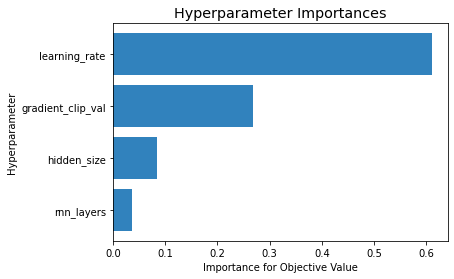

In [ ]:
optuna.visualization.matplotlib.plot_param_importances(study)
plt.show()

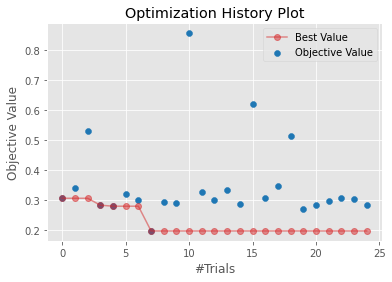



Number of finished trials:  25
Best trial:
  Value:  0.1963409185409546
  Params: 
    learning_rate: 0.04767522540455405
    hidden_size: 256
    gradient_clip_val: 0.0035513963080545286
    rnn_layers: 2


In [ ]:
optuna.visualization.matplotlib.plot_optimization_history(study)
plt.show()
print("\n")

print("Number of finished trials: ", len(study.trials))

print("Best trial:")
trial = study.best_trial

print("  Value: ", trial.value)

print("  Params: ")
for key, value in trial.params.items():
    print("    {}: {}".format(key, value))

In [ ]:
torch.manual_seed(42) 

# create dataset and dataloader
max_encoder_length = 90    # encoder LSTM에 들어가는 길이
max_prediction_length = 20 # decoder의 길이
log_interval = 10
log_val_interval = 1
limit_train_batches = 50
batch_size = 128
gpus = 1
max_epochs = 150

# Training_cutoff는 trainingset을 정하기 위한 기준으로 max_prediction_length만 잘라서는 안될거 같음
# 일단 데이터 기간의 30%를 validation으로 정의
training_cutoff = int(res_data['time_index'].max() * .7)


training = TimeSeriesDataSet(
        res_data[lambda x: x.time_index <= training_cutoff],
        time_idx="time_index",
        target="trade_price",
        categorical_encoders={"market": NaNLabelEncoder().fit(res_data.market)},
        group_ids=["market"],
        max_encoder_length=max_encoder_length,
        max_prediction_length=max_prediction_length,
        time_varying_unknown_reals= ["trade_price"],
        time_varying_known_reals=["time_index","dayofweek","month"], 
        static_categoricals=["market"],
        add_relative_time_idx=False,
        add_target_scales=True,
        allow_missing_timesteps=True,
        randomize_length=(0.2, 0.05),
)

validation = TimeSeriesDataSet.from_dataset(
    training,
    res_data,
    min_prediction_idx = training_cutoff + 1,
    # stop_randomization=True
)

train_dataloader = training.to_dataloader(train = True, batch_size = batch_size, num_workers = 0)
val_dataloader = validation.to_dataloader(train = False, batch_size = batch_size, num_workers = 0)

early_stop_callback = EarlyStopping(monitor="val_loss", min_delta=1e-4, patience=10, verbose=True, mode="min")
lr_logger = LearningRateMonitor()

net = DeepAR.from_dataset(
    training, 
    learning_rate= study.best_params['learning_rate'],
    log_interval=log_interval,
    log_val_interval=log_val_interval,
    hidden_size= study.best_params['hidden_size'],
    rnn_layers= study.best_params['rnn_layers'],
    loss= MultivariateNormalDistributionLoss(rank=30)
)


trainer = pl.Trainer(
    max_epochs =  max_epochs,
    gpus = gpus,
    weights_summary = 'top',
    gradient_clip_val =  study.best_params['gradient_clip_val'],
    callbacks = [lr_logger, early_stop_callback],
    limit_train_batches =  limit_train_batches,
    enable_checkpointing = True,
    auto_lr_find = True,
    logger = TensorBoardLogger('./best_logs')
)

print(f"Number of parameters in network: {net.size()/1e3:.1f}k")

trainer.fit(
    net,
    train_dataloaders = train_dataloader,
    val_dataloaders = val_dataloader,
)

best_model_path = trainer.checkpoint_callback.best_model_path
best_model = net.load_from_checkpoint(best_model_path)

# torch.save(best_model.state_dict(), save_model)

actuals = torch.cat([y[0] for x, y in iter(val_dataloader)])
predictions, _ = best_model.predict(val_dataloader, return_x=True, n_samples=100)


print(f'MAE : {(actuals - predictions).abs().mean()}')

SMAPE = (2 * (predictions - actuals).abs() / (predictions.abs() + actuals.abs() + 1e-8)).mean()
print(f'SMAPE : {SMAPE}')



# raw_predictions, x = net.predict(val_dataloader, mode="raw", return_x=True, n_samples=100)

# market = validation.x_to_index(x)["market"]
# for idx in range(1):  # plot 10 examples
#     best_model.plot_prediction(x, raw_predictions, idx=idx, add_loss_to_title=True)
#     plt.suptitle(f"Market: {market.iloc[idx]}")


In [ ]:
save_model

'/content/drive/MyDrive/Colab Notebooks/실무인증/Data/22061912_DeepAR_pca_saved_model.pth'

In [ ]:

# best_model load
best_model1 = DeepAR.from_dataset(
    training, 
    learning_rate= study.best_params['learning_rate'],
    log_interval=log_interval,
    log_val_interval=log_val_interval,
    hidden_size= study.best_params['hidden_size'],
    rnn_layers= study.best_params['rnn_layers'],
    loss= MultivariateNormalDistributionLoss(rank=30)
)

best_model1.load_state_dict(torch.load(save_model))
best_model1.eval()


print(f"Number of parameters in network: {net.size()/1e3:.1f}k")


actuals = torch.cat([y[0] for x, y in iter(val_dataloader)])
predictions, _ = best_model1.predict(val_dataloader, return_x=True, n_samples=100)

print(f'MAE : {(actuals - predictions).abs().mean()}')

SMAPE = (2 * (predictions - actuals).abs() / (predictions.abs() + actuals.abs() + 1e-8)).mean()
print(f'SMAPE : {SMAPE}')



Number of parameters in network: 805.9k
MAE : 0.0907331183552742
SMAPE : 0.16682222485542297


In [ ]:
best_model

DeepAR(
  (loss): MultivariateNormalDistributionLoss()
  (logging_metrics): ModuleList(
    (0): SMAPE()
    (1): MAE()
    (2): RMSE()
    (3): MAPE()
    (4): MASE()
  )
  (embeddings): MultiEmbedding(
    (embeddings): ModuleDict(
      (market): Embedding(1, 1)
    )
  )
  (rnn): LSTM(7, 256, num_layers=2, batch_first=True, dropout=0.1)
  (distribution_projector): Linear(in_features=256, out_features=32, bias=True)
)

In [ ]:
actuals.shape # 데이터 전체 길이 - training_cutoff - max_prediction_length ( len(res_data) - int(res_data['time_index'].max() * .7) -20 )

torch.Size([493, 20])

In [ ]:
pd.DataFrame(actuals.numpy()) # 하루씩 지나가면서 각 일자별로 20일 이후의 실제값 ( 행 : 기준일자, 열 : 20일씩 일자별 예측 일자 )

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,0.133831,0.178450,0.191672,0.199902,0.217676,0.226519,0.231072,0.237639,0.233611,0.198326,0.191847,0.202704,0.219077,0.211810,0.222667,0.221791,0.223805,0.247708,0.250160,0.203492
1,0.178450,0.191672,0.199902,0.217676,0.226519,0.231072,0.237639,0.233611,0.198326,0.191847,0.202704,0.219077,0.211810,0.222667,0.221791,0.223805,0.247708,0.250160,0.203492,0.221353
2,0.191672,0.199902,0.217676,0.226519,0.231072,0.237639,0.233611,0.198326,0.191847,0.202704,0.219077,0.211810,0.222667,0.221791,0.223805,0.247708,0.250160,0.203492,0.221353,0.222842
3,0.199902,0.217676,0.226519,0.231072,0.237639,0.233611,0.198326,0.191847,0.202704,0.219077,0.211810,0.222667,0.221791,0.223805,0.247708,0.250160,0.203492,0.221353,0.222842,0.251736
4,0.217676,0.226519,0.231072,0.237639,0.233611,0.198326,0.191847,0.202704,0.219077,0.211810,0.222667,0.221791,0.223805,0.247708,0.250160,0.203492,0.221353,0.222842,0.251736,0.241317
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
488,0.609670,0.599163,0.588656,0.563264,0.515458,0.525440,0.488491,0.447164,0.455219,0.462048,0.474832,0.449265,0.455394,0.416343,0.435781,0.427901,0.430353,0.443486,0.427025,0.425624
489,0.599163,0.588656,0.563264,0.515458,0.525440,0.488491,0.447164,0.455219,0.462048,0.474832,0.449265,0.455394,0.416343,0.435781,0.427901,0.430353,0.443486,0.427025,0.425624,0.420196
490,0.588656,0.563264,0.515458,0.525440,0.488491,0.447164,0.455219,0.462048,0.474832,0.449265,0.455394,0.416343,0.435781,0.427901,0.430353,0.443486,0.427025,0.425624,0.420196,0.388675
491,0.563264,0.515458,0.525440,0.488491,0.447164,0.455219,0.462048,0.474832,0.449265,0.455394,0.416343,0.435781,0.427901,0.430353,0.443486,0.427025,0.425624,0.420196,0.388675,0.373090


In [ ]:
pd.DataFrame(predictions.numpy()) # 하루씩 지나가면서 각 일자별로 20일 이후의 예측값 ( 행 : 기준일자, 열 : 20일씩 일자별 예측 일자 )

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,0.154133,0.159877,0.124343,0.134327,0.146085,0.173483,0.129076,0.124781,0.130678,0.128657,0.132713,0.132580,0.142478,0.115982,0.113103,0.116543,0.109474,0.116815,0.112355,0.114250
1,0.168830,0.172932,0.132536,0.139254,0.147636,0.170000,0.135655,0.128520,0.134358,0.131542,0.134312,0.134097,0.144614,0.118194,0.115469,0.121381,0.113644,0.120516,0.115646,0.117327
2,0.256965,0.226946,0.150940,0.160061,0.174626,0.212094,0.147693,0.140784,0.149546,0.144638,0.147703,0.147873,0.158553,0.127974,0.125959,0.132472,0.120194,0.127660,0.122145,0.123737
3,0.278611,0.240434,0.157083,0.168932,0.184405,0.222160,0.159777,0.148074,0.157012,0.153854,0.155477,0.154961,0.163895,0.132255,0.126970,0.133626,0.120803,0.127449,0.120827,0.124329
4,0.281327,0.251217,0.167859,0.179089,0.191469,0.235696,0.170171,0.158019,0.165573,0.161199,0.162404,0.160534,0.176681,0.139070,0.133356,0.139599,0.125316,0.133962,0.124174,0.130364
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
488,0.639428,0.636494,0.631211,0.637924,0.643736,0.612474,0.624392,0.625013,0.632269,0.620588,0.618842,0.621021,0.637032,0.649548,0.650217,0.667548,0.629597,0.635520,0.651793,0.641117
489,0.628785,0.616056,0.613037,0.627546,0.632274,0.604038,0.614256,0.617146,0.623294,0.613450,0.621013,0.618736,0.636102,0.648737,0.649898,0.663211,0.625080,0.644026,0.654257,0.646704
490,0.619141,0.602550,0.606502,0.620103,0.624943,0.596117,0.607530,0.611543,0.614678,0.605512,0.618265,0.612282,0.632298,0.642030,0.639333,0.645710,0.621401,0.638573,0.648335,0.637267
491,0.609855,0.605662,0.607854,0.618122,0.621744,0.595458,0.604965,0.611926,0.619683,0.606023,0.619989,0.612897,0.628943,0.639910,0.637298,0.657701,0.623592,0.640048,0.650636,0.636956


In [ ]:
max_pred_len = len(res_data) - int(res_data['time_index'].max() * .7) - 20 # 493 번쨰 ( 마지막 일자 ) 이후 20일을 비교하려고 함
max_pred_len

493

In [ ]:
predict_max = predictions[max_pred_len-1] # 493 번째
predict_max = predict_max.numpy().reshape(-1,1) # inverse_transform 을 위해 데이터 변환
predict_max = scaler_t.inverse_transform(predict_max) # inverse_transform 
predict_max

array([[3500009.5],
       [3480911.8],
       [3480639.5],
       [3543767.8],
       [3564799. ],
       [3442047.2],
       [3484591.5],
       [3536023. ],
       [3563632.8],
       [3501522. ],
       [3580791. ],
       [3537847.8],
       [3642482. ],
       [3691209.2],
       [3711096.8],
       [3837489.2],
       [3638168.8],
       [3729962. ],
       [3794919.8],
       [3712655.2]], dtype=float32)

In [ ]:
actual_max = actuals[max_pred_len-1] # 493 번째
actual_max = actual_max.numpy().reshape(-1,1) # inverse_transform 을 위해 데이터 변환
actual_max = scaler_t.inverse_transform(actual_max) # inverse_transform
actual_max

array([[3038000. ],
       [3095000. ],
       [2884000. ],
       [2648000. ],
       [2694000. ],
       [2733000. ],
       [2806000. ],
       [2660000. ],
       [2695000. ],
       [2472000. ],
       [2583000. ],
       [2538000. ],
       [2552000. ],
       [2627000. ],
       [2533000. ],
       [2525000. ],
       [2494000.2],
       [2314000. ],
       [2225000. ],
       [2286000. ]], dtype=float32)

In [ ]:
# pred & real 데이터 

predict_max = predictions[max_pred_len-1] # 493 번째
predict_max = predict_max.numpy().reshape(-1) 
pred_data = np.append(res_data.loc[:len(res_data)-max_prediction_length-1,'trade_price'].values, predict_max) # real과 pred 결합
pred_data = scaler_t.inverse_transform(np.expand_dims(pred_data,1)) # inverse_transform 

real_data = scaler_t.inverse_transform(np.expand_dims(res_data.loc[:,'trade_price'],1))

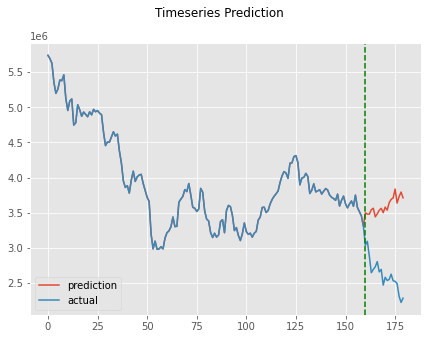

In [ ]:
plot_length = len(res_data)-max_encoder_length*2

plt.figure(figsize=(7, 5))
plt.plot(pred_data[plot_length:], label='prediction')
plt.plot(real_data[plot_length:], label='actual')
plt.axvline(x = len(real_data[plot_length:])-20, c = 'g', linestyle = '--')
plt.suptitle('Timeseries Prediction')
plt.legend()
plt.show()

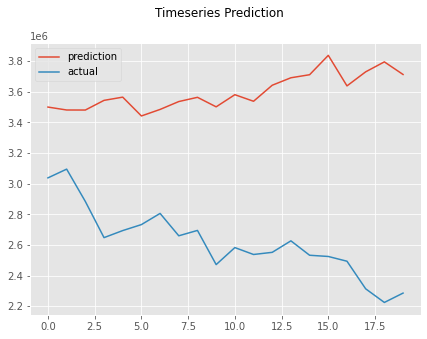

In [ ]:
plot_length = len(res_data)-max_prediction_length

plt.figure(figsize=(7, 5))
plt.plot(pred_data[plot_length:], label='prediction')
plt.plot(real_data[plot_length:], label='actual')
plt.suptitle('Timeseries Prediction')
plt.legend()
plt.show()

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
LR finder stopped early after 1080 steps due to diverging loss.
Restoring states from the checkpoint path at /content/.lr_find_312afb30-6460-4ed7-9483-cc86e780d17e.ckpt
Failed to compute suggesting for `lr`. There might not be enough points.
Traceback (most recent call last):
  File "/usr/local/lib/python3.7/dist-packages/pytorch_lightning/tuner/lr_finder.py", line 177, in suggestion
    min_grad = np.gradient(loss).argmin()
  File "<__array_function__ internals>", line 6, in gradient
  File "/usr/local/lib/python3.7/dist-packages/numpy/lib/function_base.py", line 1065, in gradient
    "Shape of array too small to calculate a numerical gradient, "
ValueError: Shape of array too small to calculate a numerical gradient, at least (edge_order + 1) elements are required.


suggested learning rate: 0.07254644904469239


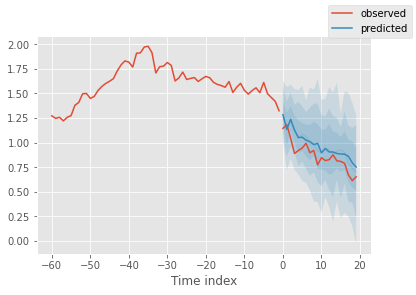

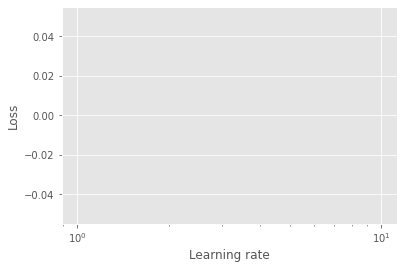

In [ ]:
# find optimal learning rate
res = trainer.tuner.lr_find(net, train_dataloaders=train_dataloader, val_dataloaders=val_dataloader, min_lr=1e-5)
print(f"suggested learning rate: {study.best_params['learning_rate']}")
fig = res.plot(show=True, suggest=True)
fig.show()
net.hparams.learning_rate = study.best_params['learning_rate']

In [ ]:
def plot_prediction(
    self,
    x: Dict[str, torch.Tensor],
    out: Dict[str, torch.Tensor],
    idx: int,
    plot_attention: bool = True,
    add_loss_to_title: bool = False,
    show_future_observed: bool = True,
    ax=None,
) -> plt.Figure:
    """
    Plot actuals vs prediction and attention

    Args:
        x (Dict[str, torch.Tensor]): network input
        out (Dict[str, torch.Tensor]): network output
        idx (int): sample index
        plot_attention: if to plot attention on secondary axis
        add_loss_to_title: if to add loss to title. Default to False.
        show_future_observed: if to show actuals for future. Defaults to True.
        ax: matplotlib axes to plot on

    Returns:
        plt.Figure: matplotlib figure
    """
    # plot prediction as normal
    fig = best_model.plot_prediction(
        x, out, idx=idx, add_loss_to_title=add_loss_to_title, show_future_observed=show_future_observed, ax=ax
    )

    # add attention on secondary axis
    if plot_attention:
        interpretation = self.interpret_output(out)
        ax = fig.axes[0]
        ax2 = ax.twinx()
        ax2.set_ylabel("Attention")
        encoder_length = x["encoder_lengths"][idx]
        ax2.plot(
            torch.arange(-encoder_length, 0),
            interpretation["attention"][idx, :encoder_length].detach().cpu(),
            alpha=0.2,
            color="k",
        )
    fig.tight_layout()
    return fig

raw_predictions, x = best_model.predict(val_dataloader, mode = 'raw', return_x=True)

best_model.plot_prediction( x=x,
    out=raw_predictions,
    idx=1)

IndexError: ignored

In [ ]:
cov_matrix = net.loss.map_x_to_distribution(
    net.predict(val_dataloader, mode=("raw", "prediction"), n_samples=None)
).covariance_matrix.mean(0)

# normalize the covariance matrix diagnoal to 1.0
correlation_matrix = cov_matrix / torch.sqrt(torch.diag(cov_matrix) * torch.diag(cov_matrix).T)

fig, ax = plt.subplots(1, 1, figsize=(10, 10))
ax.imshow(correlation_matrix, cmap="bwr");

In [ ]:
%reload_ext tensorboard
%tensorboard --logdir=best_logs/